In [1]:
import numpy as np
from sympy.physics.wigner import wigner_3j,wigner_6j
import sympy as sy
from numpy import linalg as LA
from IPython.display import Latex,display
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
sns.set_palette('terrain')
from Energy_Levels import MoleculeLevels
np.set_printoptions(precision=5, suppress=True)
import time
from matplotlib.colors import TwoSlopeNorm

In [2]:
import json
import ujson as uj

def get_json_data(file_path,numpy=False,ujson=True):
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path, 'r') as f:
        if ujson:
            data = uj.load(f)
        else:
            data = json.load(f)
    if numpy:
        data = np.array(data)
    return data

def save_json_data(data,file_path,ujson=True):
    if type(data) is np.ndarray:
        data_save = data.tolist()
    else:
        data_save=data
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path,'w') as f:
        if ujson:
            uj.dump(data_save,f)
        else:
            json.dump(data_save,f)
    print('Data saved to', file_path)

In [3]:
# Bstep = 0.2
# Bz = np.arange(0,5+Bstep,Bstep)
Bz = np.linspace(1e-3,40,1001)
Ez = np.linspace(0.1,150,1001)
# Estep = 0.01
# Ez = np.arange(0,80+Estep,Estep)
print(len(Ez),len(Bz))
print(len(Ez)*len(Bz))

1001 1001
1002001


In [123]:
state_dict = {}
eval_dict = {}
evec_dict = {}
PTV_dict = {}
trap_dict = {}
N=1

M_range = range(-(N+1),N+2,1)
M_range=[-1,1]
for M in M_range:
    M_state = MoleculeLevels.initialize_state('CaOH','40','X010',[N],M_values = 'custom',I=[0,1/2],S=1/2,round=10,M_range=[M],P_values=[1/2,3/2],trap=True,theta_num=0)
    M_state.I_trap = 0.01324*2/3.5
    state_dict[M] = M_state
    print(M)
    t0 = time.perf_counter()
    Bslices = M_state.EB_grid(Ez,Bz,PTV=True,reverse=True,E_or_B_first='E',trap_shifts=False,output=True,evecs=False,EDM_or_MQM='EDM')
    t1 = time.perf_counter()
    elapsed = t1 - t0
    print(elapsed, 'sec\n')
    eval_dict[M] = Bslices[0]
    PTV_dict[M] = Bslices[1]
#     trap_dict[M] = Bslices[2]
#     evec_dict[M] = Bslices[2]
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))

-1
[0 1 2 3 4 5]
167.952062700002 sec

1
[0 1 3 2 4 5]
167.55885060000583 sec



In [4]:
# N_state = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=True)

In [4]:
# state_dict = {}
# eval_dict = {}
# evec_dict = {}
# PTV_dict = {}
N=1

M_range = range(-(N+1),N+2,1)
theta_num=0
trap = False
N_state = MoleculeLevels.initialize_state('CaOH','40','X010',[N],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=trap,theta_num=theta_num)
N_state.I_trap = 0.01324*2/3.5
t0 = time.perf_counter()
slices = N_state.EB_grid(Ez,Bz,PTV=True,E_or_B_first='E',reverse=True,output=True,evecs=False,trap_shifts=False,order_states=False,EDM_or_MQM='EDM')
t1 = time.perf_counter()
elapsed = t1 - t0
print(elapsed, 'sec\n')
evals_N = slices[0]
PTV_N = slices[1]
# trap_N = slices[2]
# evec_N = Bslices[2]
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
80.10143819999999 sec



In [74]:
evals_N[14,74,0]

9994.1867021

In [75]:
trap_N[14,74,0]

-14.35204381

In [28]:
N_state2 = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=True)

In [29]:
N_state2.I_trap = 0.01324*2/3.5
evals0,evecs0=N_state2.eigensystem(1e-3,1e-3)

In [5]:
N_state2.I_trap = 0.01324
evals1,evecs1=N_state2.eigensystem(1e-3,1e-3)

In [30]:
H0_trap = N_state2.trap_matrix(theta_trap=0,rank=0)
H2_trap = N_state2.trap_matrix(theta_trap=0,rank=2)

In [31]:
np.diagonal(H2_trap)*0.01324

array([ 0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,
        0.     ,  0.     ,  0.19149,  0.19149, -0.38299, -0.38299,
        0.19149,  0.19149,  0.38299,  0.38299, -0.19149, -0.19149,
       -0.38299, -0.38299, -0.19149, -0.19149,  0.38299,  0.38299])

In [20]:
angle = np.linspace(0,np.pi,30)
N_state2.I_trap = 0.01324
N_state2.eigensystem(Ez[0],Bz[0])
vals_a,vecs_a= N_state.AngleMap(angle, Ez[74], Bz[0],output=True)

NameError: name 'Ez' is not defined

In [109]:
N_state2.evals0[14]

10007.0607045

In [110]:
background

10008.538745908012

In [86]:

v = vecs_a[0,14,:]
H0_trap=N_state.trap_matrix(theta_trap=angle[0])
E0 = v@H0_trap@v
print(E0)

-14.352043808012176


In [90]:
background = vals_a[0,14] - E0

In [91]:
background

10008.538745908012

In [48]:
N_state.E0

56.025

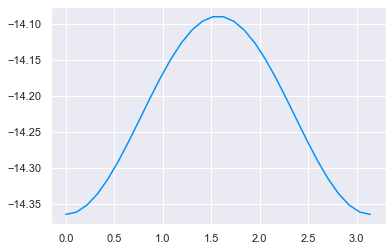

In [94]:
plt.plot(angle,vals.T[14]-background)

In [54]:
H_trap=N_state.trap_matrix()

In [55]:
s = []
i=13
for idx in range(len(vecs)):
    s.append(vecs[idx,i]@N_state.trap_matrix(theta_trap=angle[idx])@vecs[idx,i])

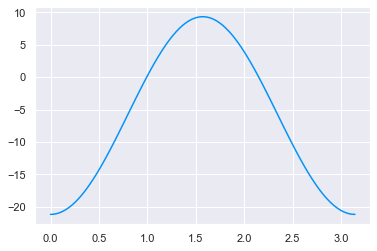

In [56]:
plt.plot(angle,s)

In [57]:
print(s[31],angle[31])

-0.25678487632973246 0.9837310329422585


In [58]:
s2 = []
i=14
for idx in range(len(vecs)):
    s2.append(vecs[idx,i]@N_state.trap_matrix(theta_trap=angle[idx])@vecs[idx,i])

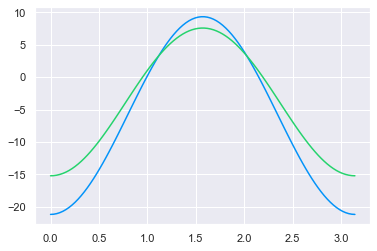

In [59]:
plt.plot(angle,s)
plt.plot(angle,s2)

In [102]:
theta = angle
t20 = (3*np.cos(theta)-1)/np.sqrt(6)
t21 = -1*(- (np.sin(2*theta)/2))
t22 = 2*(np.sin(theta)**2)/2

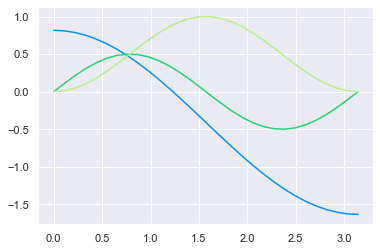

In [105]:
plt.plot(theta,t20)
plt.plot(theta,t21)
plt.plot(theta,t22)

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_18756/2077217156.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_18756/2077217156.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


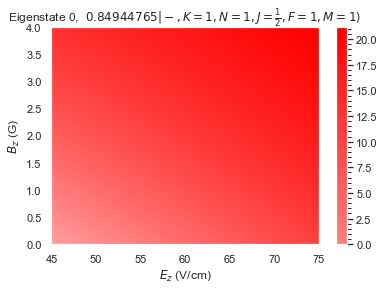

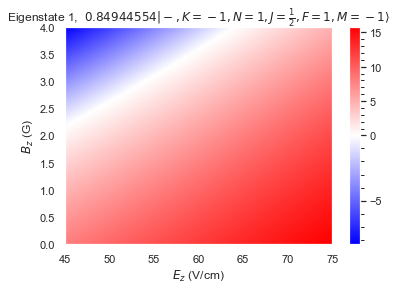

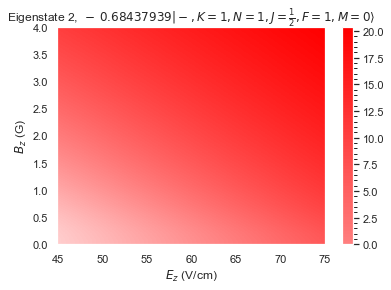

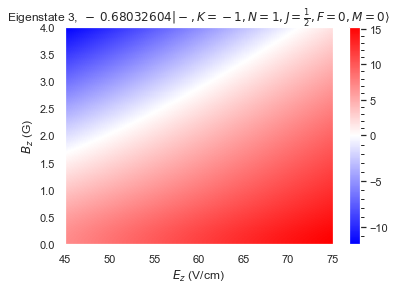

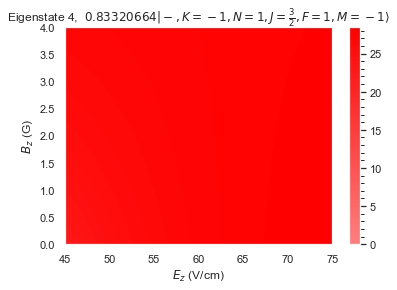

...

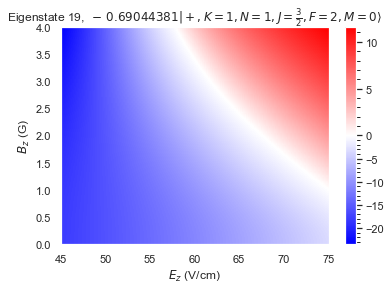

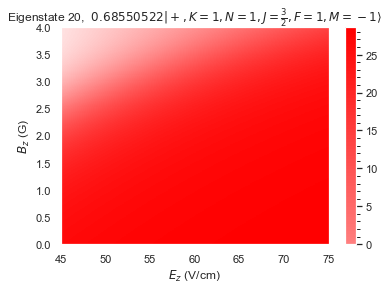

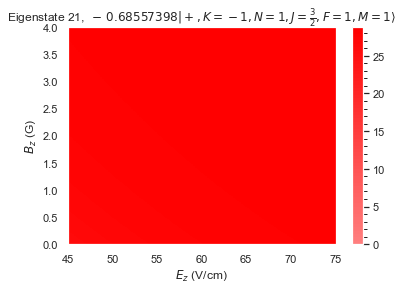

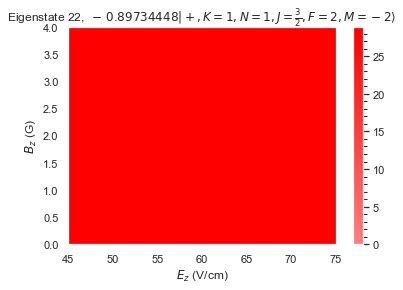

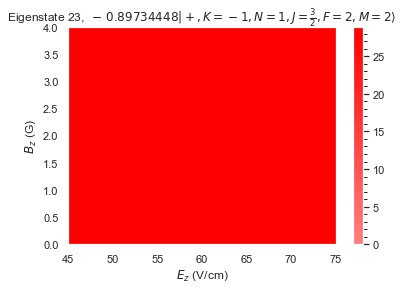

In [14]:
trap_EB = trap_N
for i in range(len(trap_EB)):
    plt.figure()
    plt.grid(False)
    plt.pcolormesh(*mesh,trap_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=0))
    cbar = plt.colorbar()
    cbar.minorticks_on()
    plt.title(r'Eigenstate {}, {}'.format(i,N_state.gen_state_str(i,single=True,parity=True)))
    plt.xlabel(r'$E_z$ (V/cm)')
    plt.ylabel(r'$B_z$ (G)')

In [18]:
N_state.evals0

array([ 9957.16263,  9957.16263,  9957.16263,  9958.52534,  9983.16739,
        9983.16739,  9983.16739,  9984.77174,  9984.77174,  9984.77174,
        9984.77174,  9984.77175, 10000.22263, 10000.22263, 10000.22263,
       10001.58534, 10026.22739, 10026.22739, 10026.22739, 10027.83174,
       10027.83174, 10027.83174, 10027.83174, 10027.83175])

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_16896/1797885323.py:8: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_16896/1797885323.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


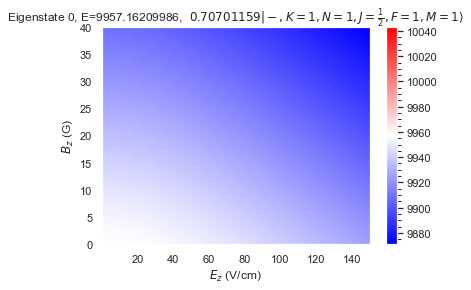

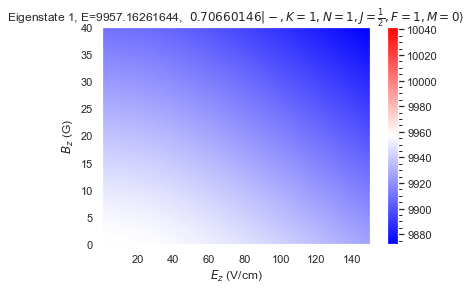

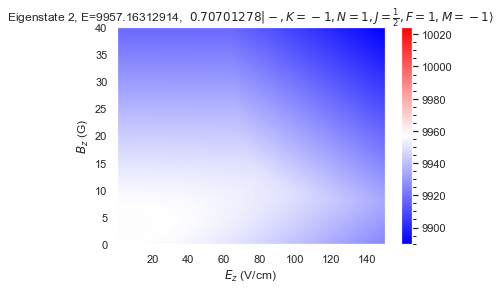

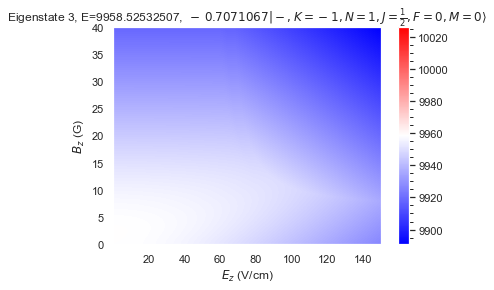

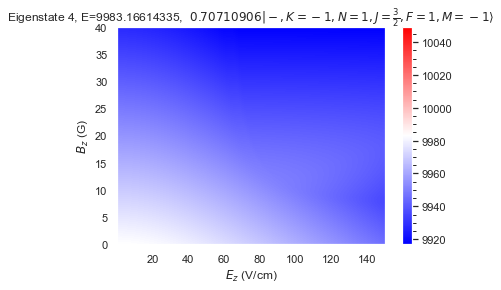

...

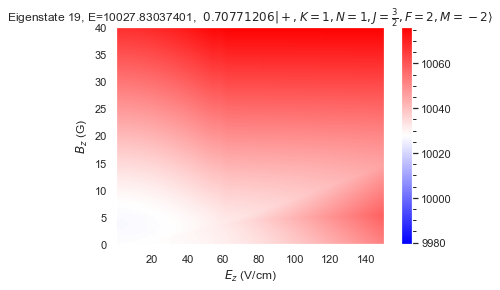

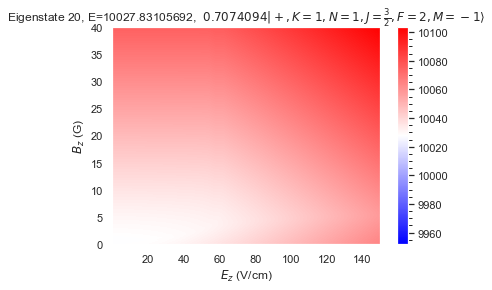

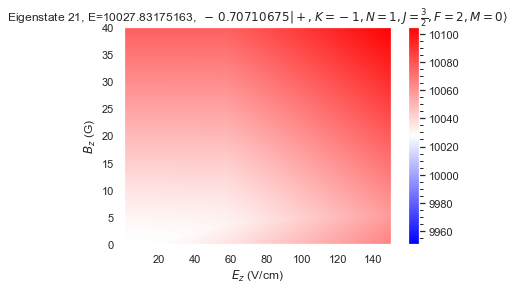

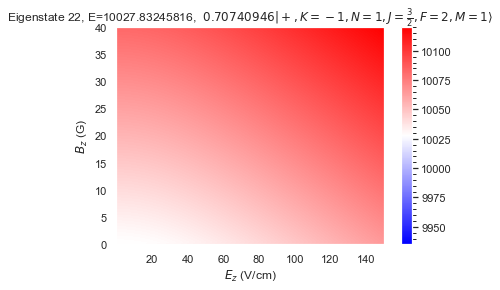

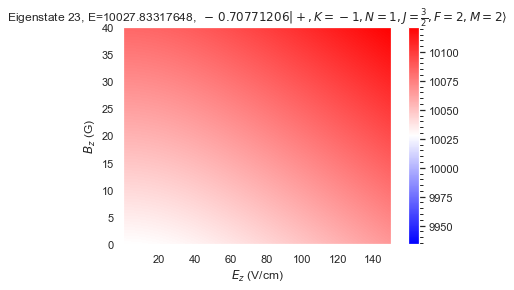

In [5]:
evals_EB = evals_N #evals_N
for i in range(len(evals_EB)):
    plt.figure()
    E0 = evals_EB[i][0,0]
    max_delta = max(abs(evals_EB[i].max()-E0),abs(evals_EB[i].min()-E0))
    plt.grid(False)
    plt.pcolormesh(*mesh,evals_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=E0,vmin=E0-max_delta,vmax=E0+max_delta))
    cbar = plt.colorbar()
    cbar.minorticks_on()
    plt.title(r'Eigenstate {}, E={}, {}'.format(i,E0,N_state.gen_state_str(i,single=True,parity=True)))
    plt.xlabel(r'$E_z$ (V/cm)')
    plt.ylabel(r'$B_z$ (G)')

(9980.0, 10000.0)

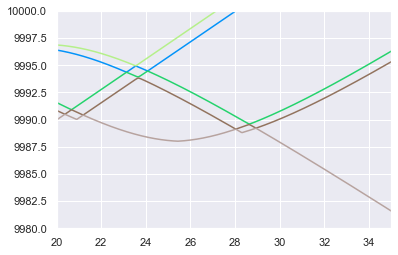

In [22]:
plt.plot(Bz,evals_EB[12,-300])
plt.plot(Bz,evals_EB[11,-300])
plt.plot(Bz,evals_EB[13,-300])
plt.plot(Bz,evals_EB[14,-300])
plt.plot(Bz,evals_EB[10,-300])
plt.plot(Bz,evals_EB[9,-300])
plt.xlim(20,35)
plt.ylim(9980,10000)

In [36]:
N_state = MoleculeLevels.initialize_state('CaOH','40','X010',[1,2],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=True)

In [34]:
N_state.I_trap=0.01324*2/3.5
N_state.theta_trap = 0
N_state.eigensystem(0,1e-6);

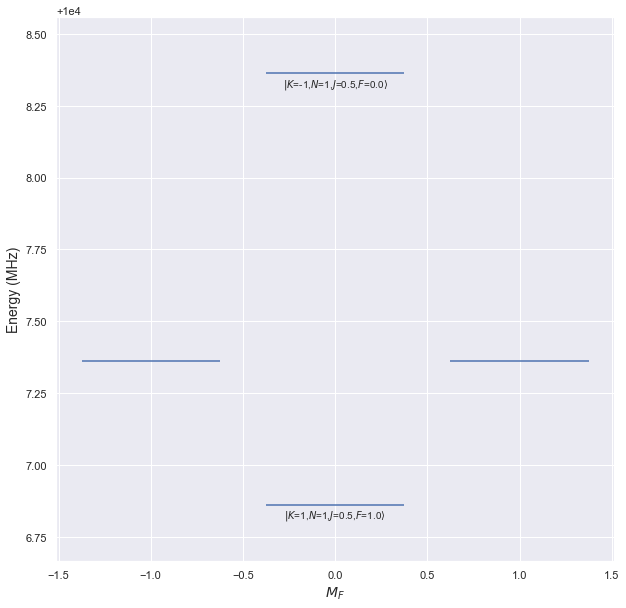

In [39]:
N_state.display_levels(58,1e-6,'F',idx=N_state.select_q({'J':0.5,'N':1},parity='+'))

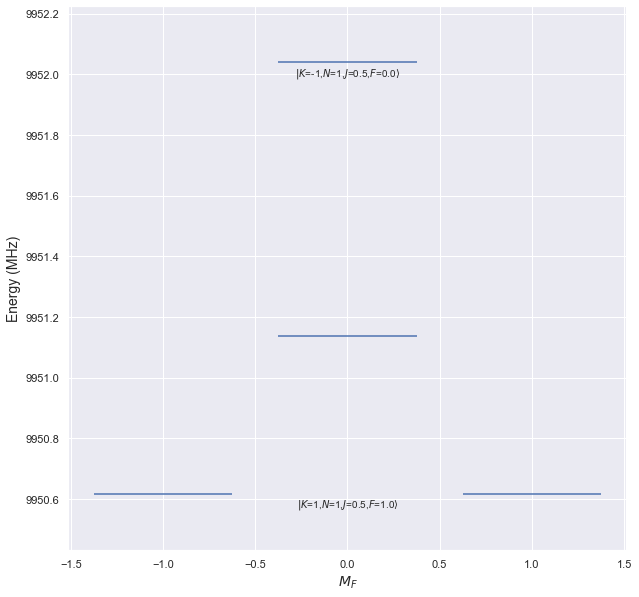

In [52]:
N_state.display_levels(60,1e-6,'F',idx=N_state.select_q({'J':0.5,'N':1},parity='-'))

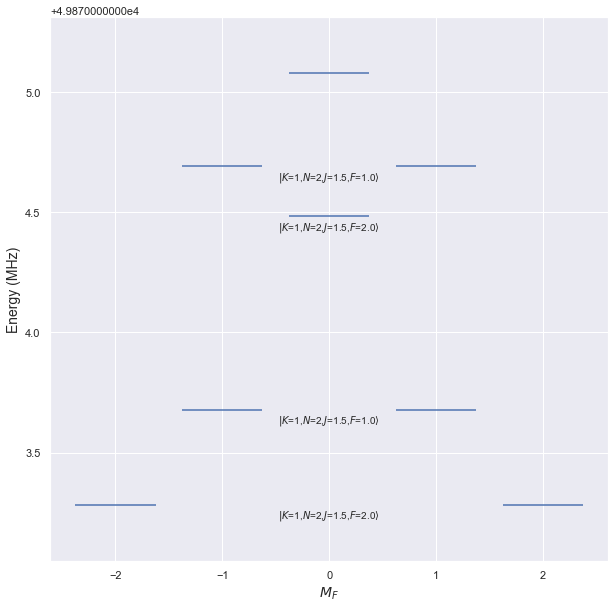

In [50]:
N_state.display_levels(60,1e-6,'F',idx=N_state.select_q({'J':1.5,'N':2},parity='+'))

In [23]:
evals_EB[:,0,0]

array([ 9957.16212,  9957.16263,  9957.16315,  9958.52534,  9983.16617,
        9983.16739,  9983.1686 ,  9984.77034,  9984.77104,  9984.77174,
        9984.77244,  9984.77314, 10000.22212, 10000.22263, 10000.22315,
       10001.58534, 10026.22617, 10026.22739, 10026.2286 , 10027.83034,
       10027.83104, 10027.83174, 10027.83244, 10027.83314])

In [131]:
N_state.B0

0.01

(9080.7284787881, 9080.7284821019)

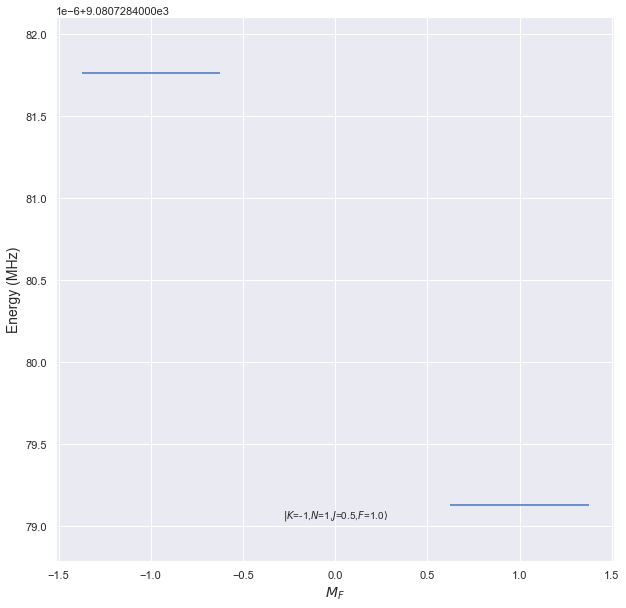

In [105]:
N_state.I_trap=1
N_state.eigensystem(0,1e-6);
N_state.display_levels(0,1e-6,'F',idx=N_state.select_q({'J':0.5,'F':1,'M':[-1,1]},parity='+'))
plt.ylim()

In [31]:
Bz

array([ 0.001  ,  0.026  ,  0.051  ,  0.07599,  0.10099,  0.12599,
        0.15099,  0.17598,  0.20098,  0.22598,  0.25098,  0.27597,
        0.30097,  0.32597,  0.35097,  0.37596,  0.40096,  0.42596,
        0.45096,  0.47595,  0.50095,  0.52595,  0.55095,  0.57594,
        0.60094,  0.62594,  0.65094,  0.67593,  0.70093,  0.72593,
        0.75093,  0.77592,  0.80092,  0.82592,  0.85092,  0.87591,
        0.90091,  0.92591,  0.95091,  0.9759 ,  1.0009 ,  1.0259 ,
        1.05089,  1.07589,  1.10089,  1.12589,  1.15088,  1.17588,
        1.20088,  1.22588,  1.25087,  1.27587,  1.30087,  1.32587,
        1.35086,  1.37586,  1.40086,  1.42586,  1.45086,  1.47585,
        1.50085,  1.52585,  1.55085,  1.57584,  1.60084,  1.62584,
        1.65084,  1.67583,  1.70083,  1.72583,  1.75083,  1.77582,
        1.80082,  1.82582,  1.85082,  1.87581,  1.90081,  1.92581,
        1.95081,  1.9758 ,  2.0008 ,  2.0258 ,  2.05079,  2.07579,
        2.10079,  2.12579,  2.15078,  2.17578,  2.20078,  2.22

(6.0, 10.0)

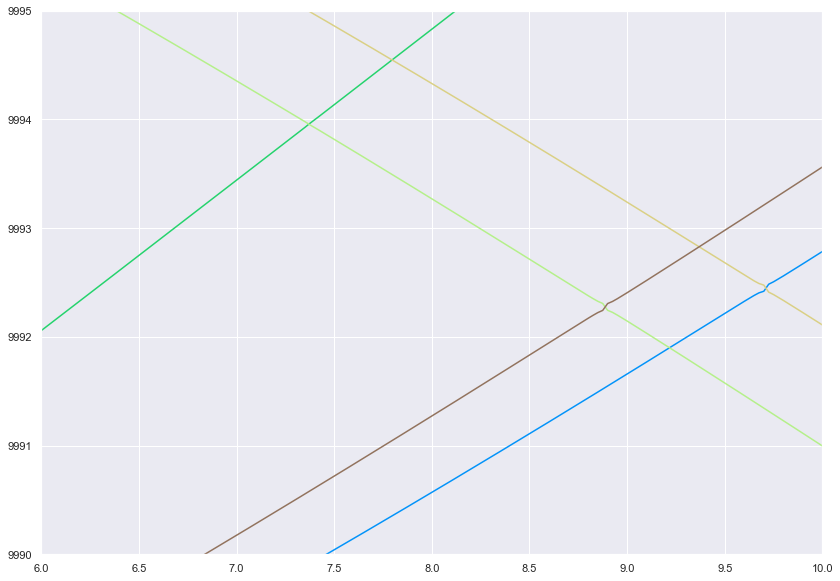

In [61]:
plt.figure(figsize=(14,10))
iE = 1
# plt.plot(Bz,evals_EB[13,iE,:])

# for i in np.arange(24):
#     plt.plot(Bz,evals_EB[i,iE,:])
    
plt.plot(Bz,evals_EB[9,iE,:])
plt.plot(Bz,evals_EB[10,iE,:])
plt.plot(Bz,evals_EB[12,iE,:])
plt.plot(Bz,evals_EB[13,iE,:])
plt.plot(Bz,evals_EB[6,iE,:])
plt.ylim(9990,9995)
plt.xlim(6,10)

In [125]:
Ez[0]

1.0

(6.0, 10.0)

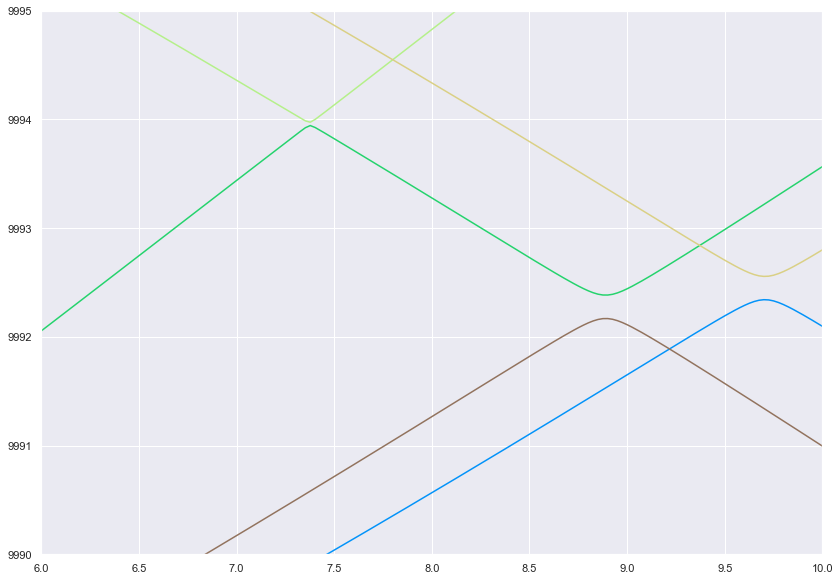

In [128]:
plt.figure(figsize=(14,10))
iE = 0
# plt.plot(Bz,evals_EB[13,iE,:])

# for i in np.arange(24):
#     plt.plot(Bz,evals_EB[i,iE,:])
    
plt.plot(Bz,evals_EB[9,iE,:])
plt.plot(Bz,evals_EB[10,iE,:])
plt.plot(Bz,evals_EB[12,iE,:])
plt.plot(Bz,evals_EB[13,iE,:])
plt.plot(Bz,evals_EB[6,iE,:])
plt.ylim(9990,9995)
plt.xlim(6,10)

In [21]:
np.searchsorted(Ez,56)

147

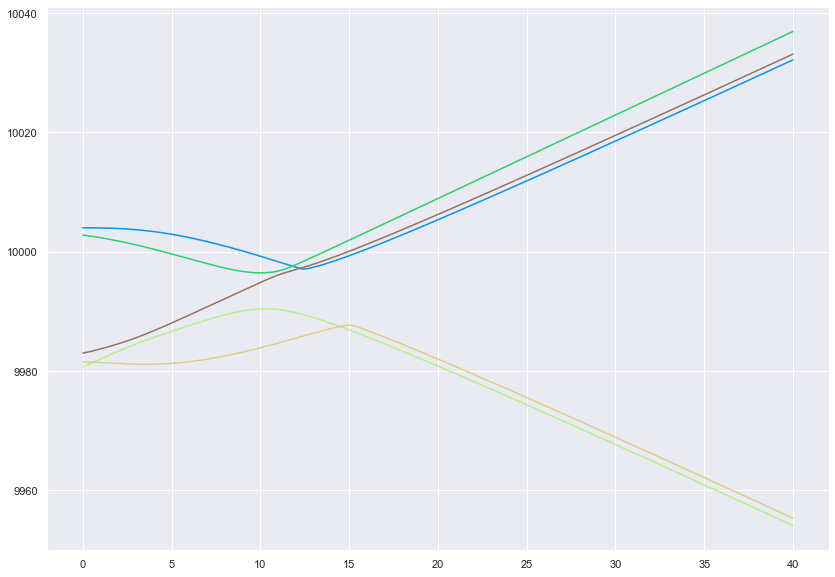

In [121]:
plt.figure(figsize=(14,10))
iE = np.searchsorted(Ez,30)
# plt.plot(Bz,evals_EB[13,iE,:])

# for i in np.arange(24):
#     plt.plot(Bz,evals_EB[i,iE,:])
    
plt.plot(Bz,evals_EB[9,iE,:])
plt.plot(Bz,evals_EB[10,iE,:])
plt.plot(Bz,evals_EB[12,iE,:])
plt.plot(Bz,evals_EB[13,iE,:])
plt.plot(Bz,evals_EB[6,iE,:])
# plt.ylim(9990,9995)
# plt.xlim(6,10)

In [89]:
Ez[0]

0.1

In [97]:
np.searchsorted(Bz,30)

750

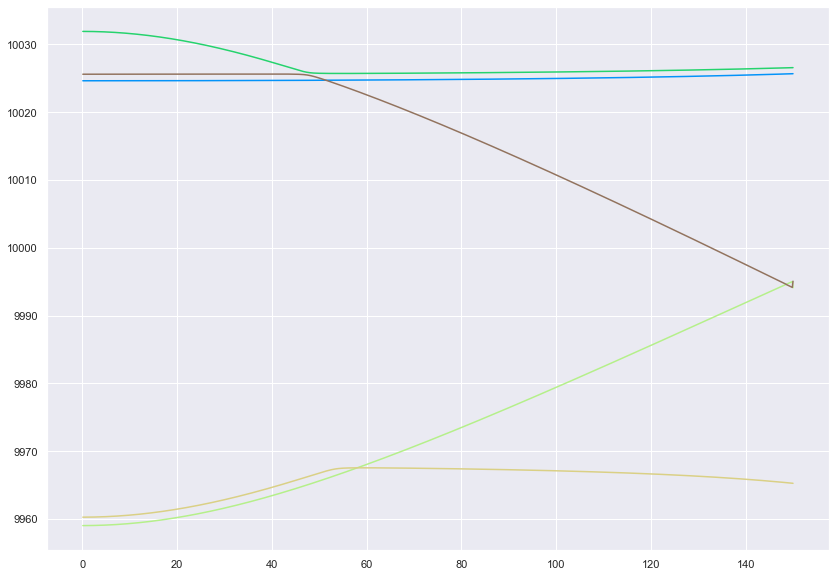

In [103]:
plt.figure(figsize=(14,10))
iB = np.searchsorted(Bz,34.5)
# plt.plot(Bz,evals_EB[13,iE,:])

# for i in np.arange(24):
#     plt.plot(Bz,evals_EB[i,iE,:])
    
plt.plot(Ez,evals_EB[9,:,iB])
plt.plot(Ez,evals_EB[10,:,iB])
plt.plot(Ez,evals_EB[12,:,iB])
plt.plot(Ez,evals_EB[13,:,iB])
plt.plot(Ez,evals_EB[6,:,iB])
# plt.ylim(9990,9995)
# plt.xlim(-0.1,20)

### 

TypeError: Dimensions of C (1001, 1001) are incompatible with X (2001) and/or Y (2001); see help(pcolormesh)

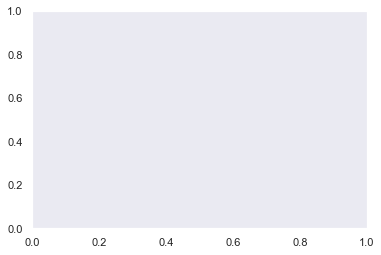

In [124]:
evals_EB = evals_N
for i in range(len(evals_EB)):
    plt.figure()
    E0 = evals_EB[i][0,0]
    max_delta = max(abs(evals_EB[i].max()-E0),abs(evals_EB[i].min()-E0))
    plt.grid(False)
    plt.pcolormesh(*mesh,evals_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=E0,vmin=E0-max_delta,vmax=E0+max_delta))
    cbar = plt.colorbar()
    cbar.minorticks_on()
    plt.title(r'Eigenstate {}, {}'.format(i,N_state.gen_state_str(i,single=True,parity=True)))
    plt.xlabel(r'$E_z$ (V/cm)')
    plt.ylabel(r'$B_z$ (G)')

In [17]:
N_state.write_state(12)

E = 10000.22263355 MHz

 0.00421396 |K=-1,N=1,J=0.5,F=1.0,M=-1.0> 

 0.00421396 |K=1,N=1,J=0.5,F=1.0,M=-1.0> 

 -0.16781832 |K=-1,N=1,J=0.5,F=1.0,M=0.0> 

 -0.16781832 |K=1,N=1,J=0.5,F=1.0,M=0.0> 

 -0.6863708 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 -0.6863708 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 -0.0001594 |K=-1,N=1,J=1.5,F=1.0,M=-1.0> 

 -0.0001594 |K=1,N=1,J=1.5,F=1.0,M=-1.0> 

 0.00634789 |K=-1,N=1,J=1.5,F=1.0,M=0.0> 

 0.00634789 |K=1,N=1,J=1.5,F=1.0,M=0.0> 

 0.02596265 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 0.02596265 |K=1,N=1,J=1.5,F=1.0,M=1.0> 



C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/689499787.py:14: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/689499787.py:18: UserWarning: No contour levels were found within the data range.
  conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/689499787.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(14,10))


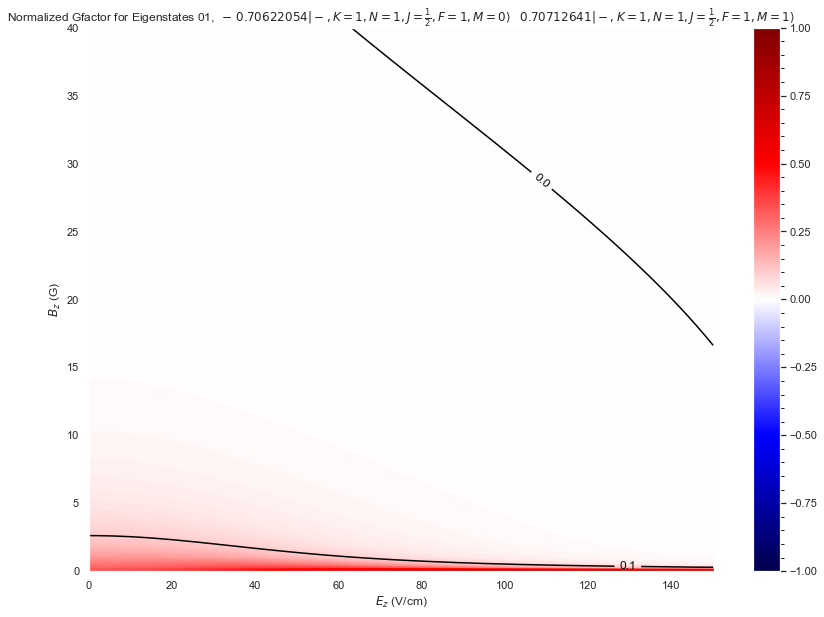

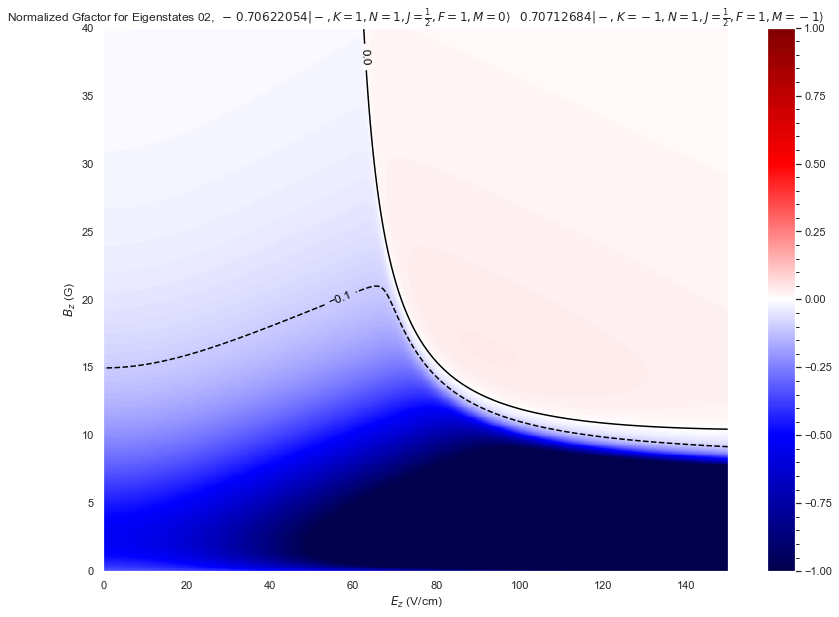

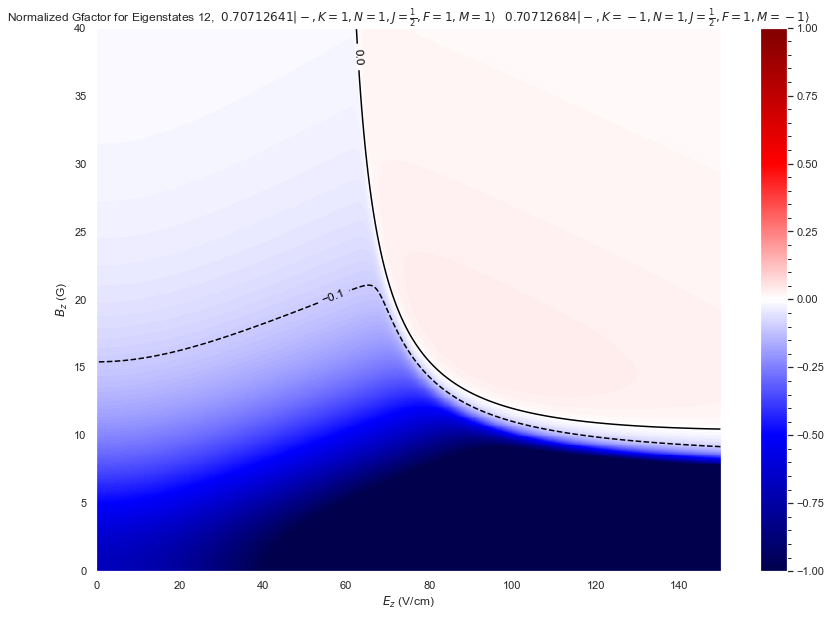

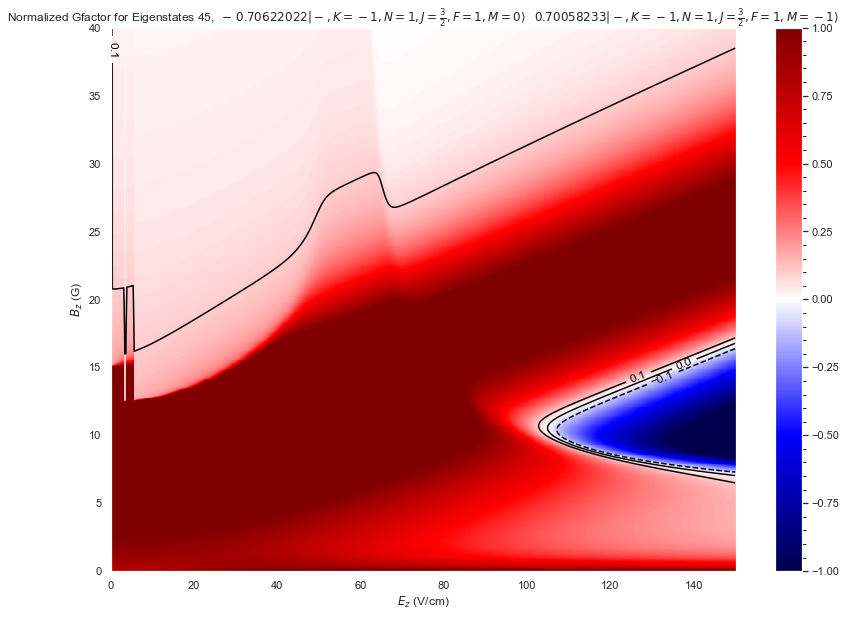

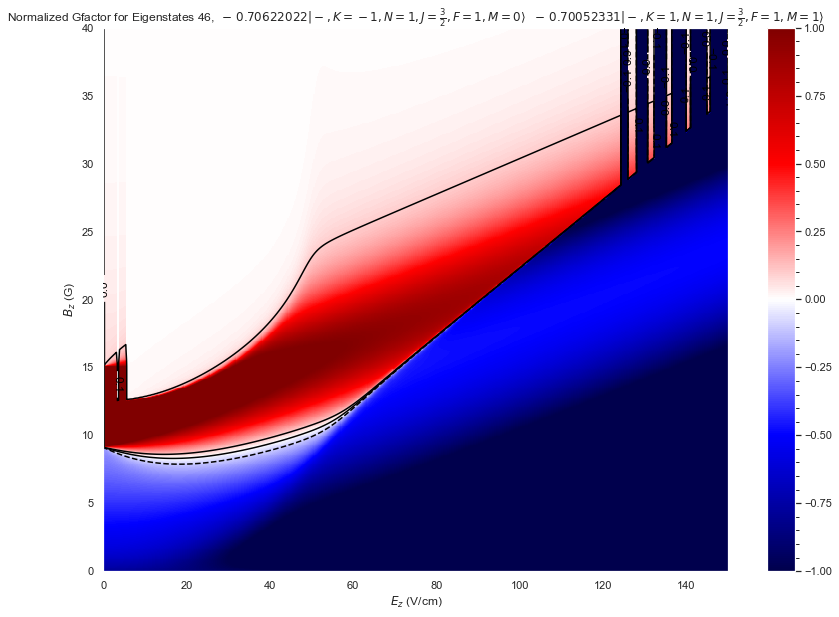

...

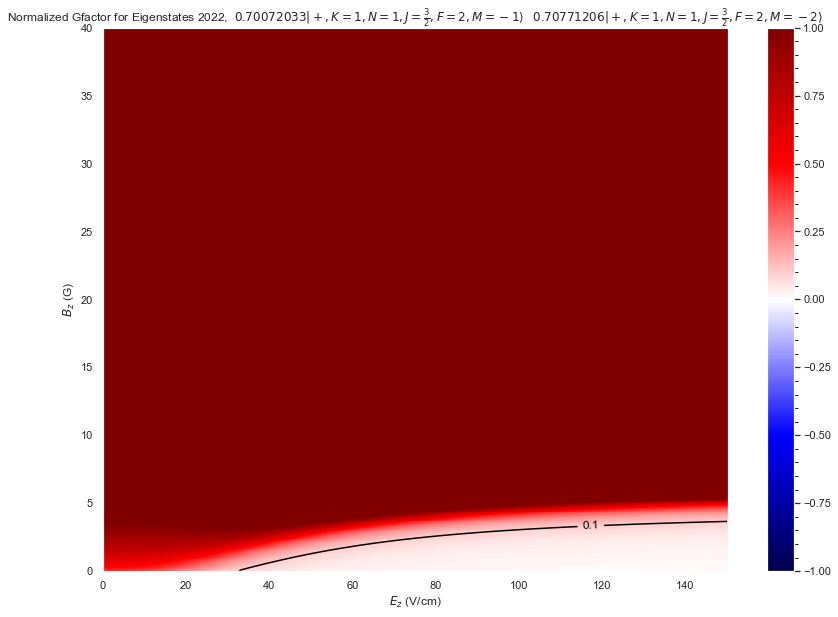

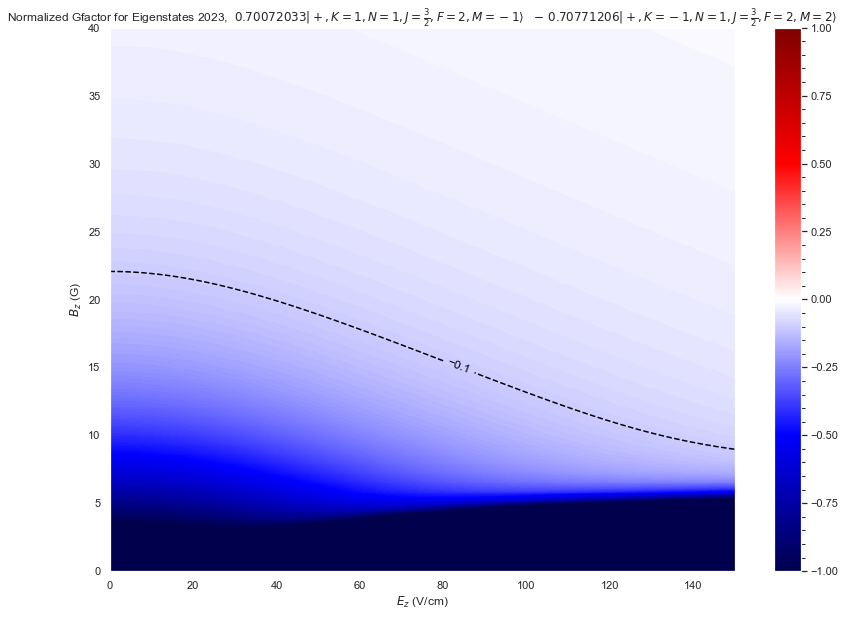

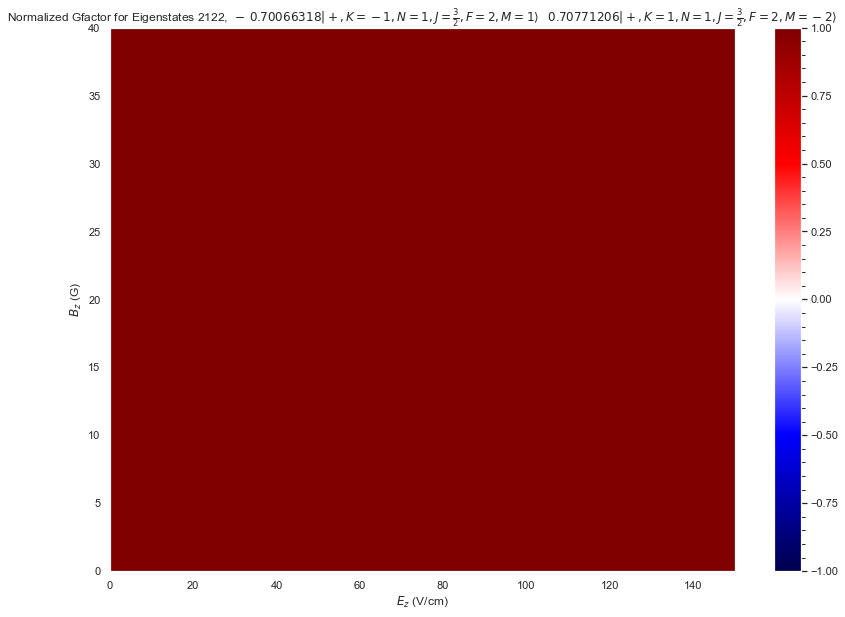

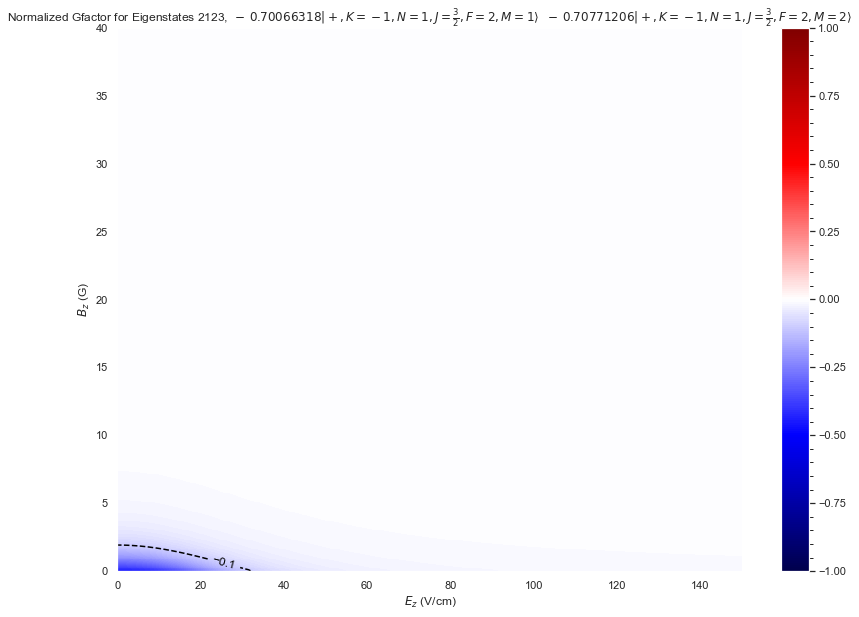

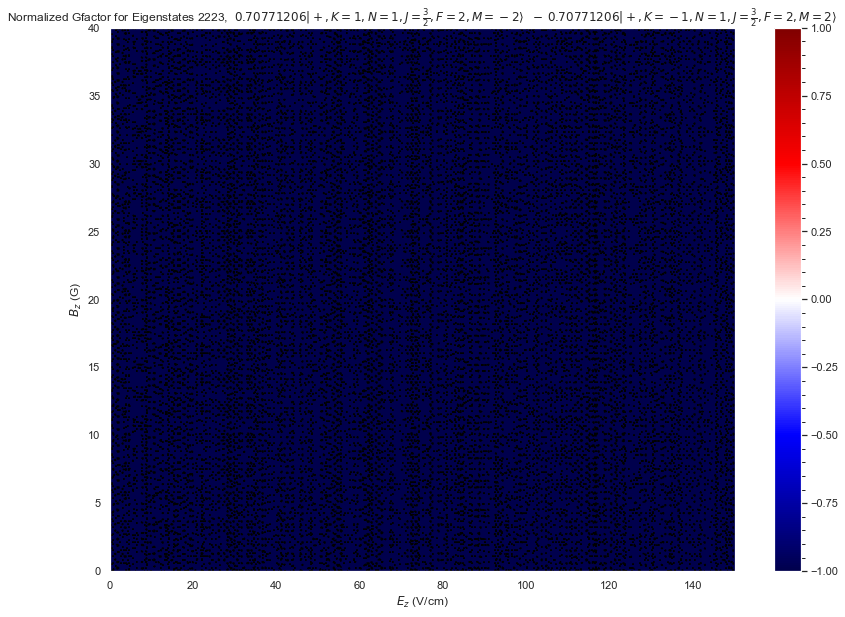

In [57]:
muBgS=1.399624494*2.0023/2
with_contour = True
evals_EB = evals_N
for i in range(len(evals_EB)):
    for j in range(i,len(evals_EB)):
        if i==j:
            continue
        if abs(evals_EB[i,0,0]-evals_EB[j,0,0])>1:
            continue
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i]-evals_EB[j])[1]/abs(Bz[-1]-Bz[-2])
        plt.grid(False)
        plt.pcolormesh(*mesh,geff/muBgS,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title(r'Normalized Gfactor for Eigenstates {}{}, {} {}'.format(i,j,N_state.gen_state_str(i,single=True,parity=True),N_state.gen_state_str(j,single=True,parity=True)))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_18756/1843404721.py:14: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_18756/1843404721.py:18: UserWarning: No contour levels were found within the data range.
  conmap = plt.contour(*mesh,geff,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))


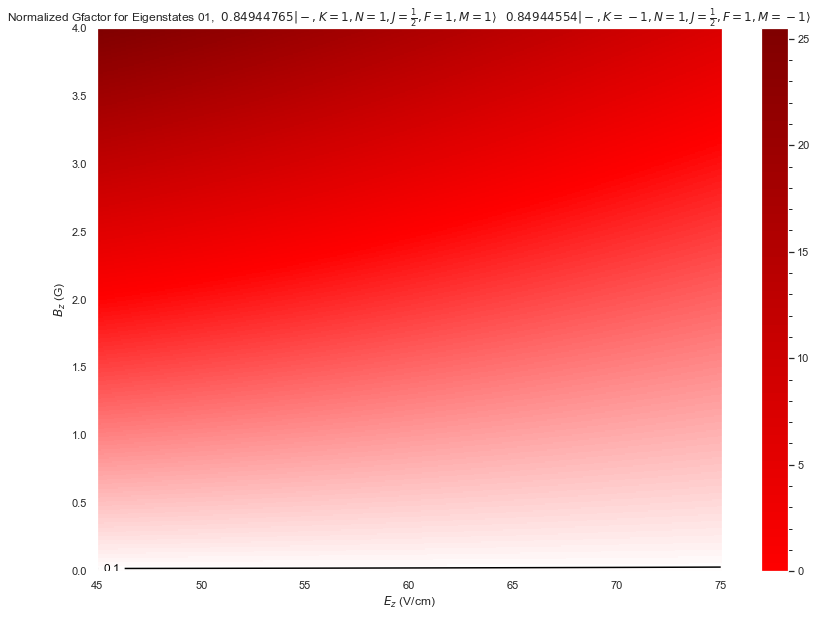

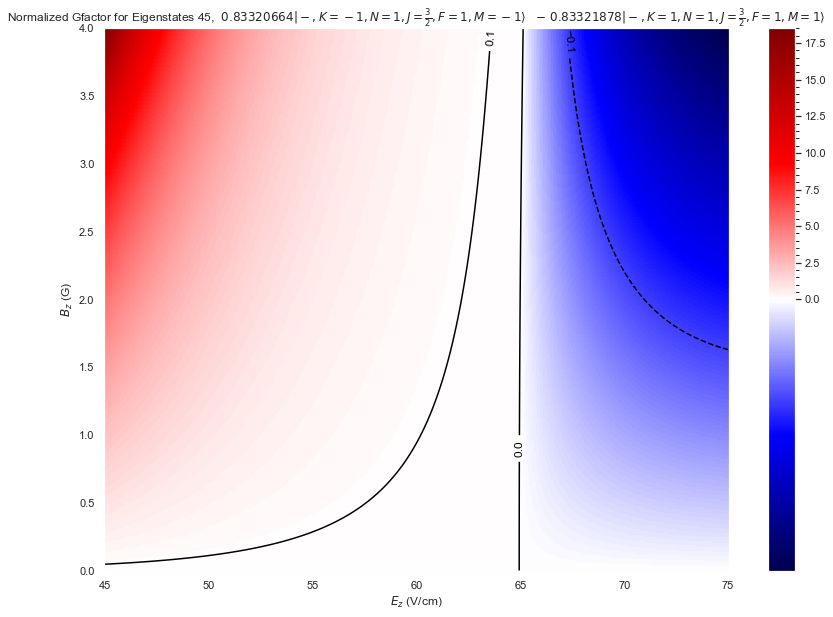

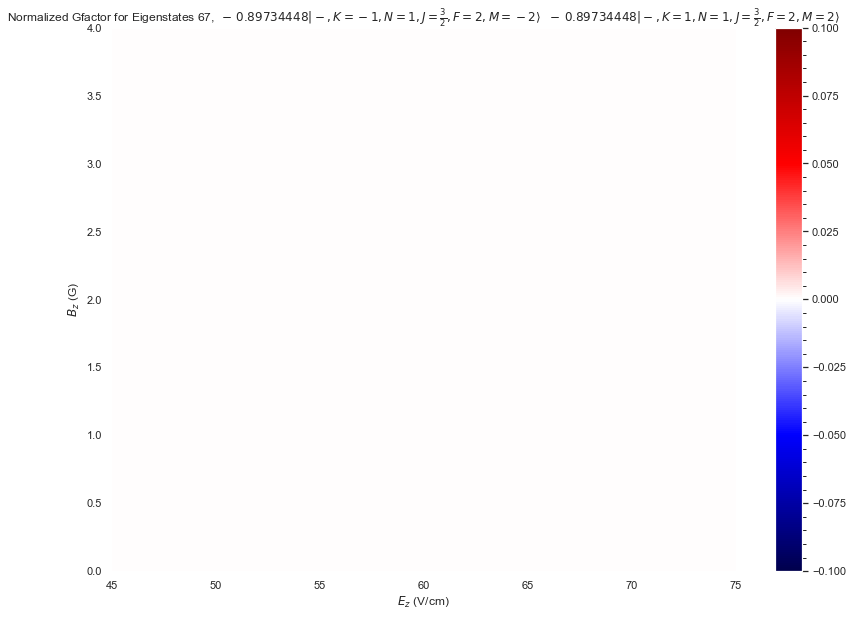

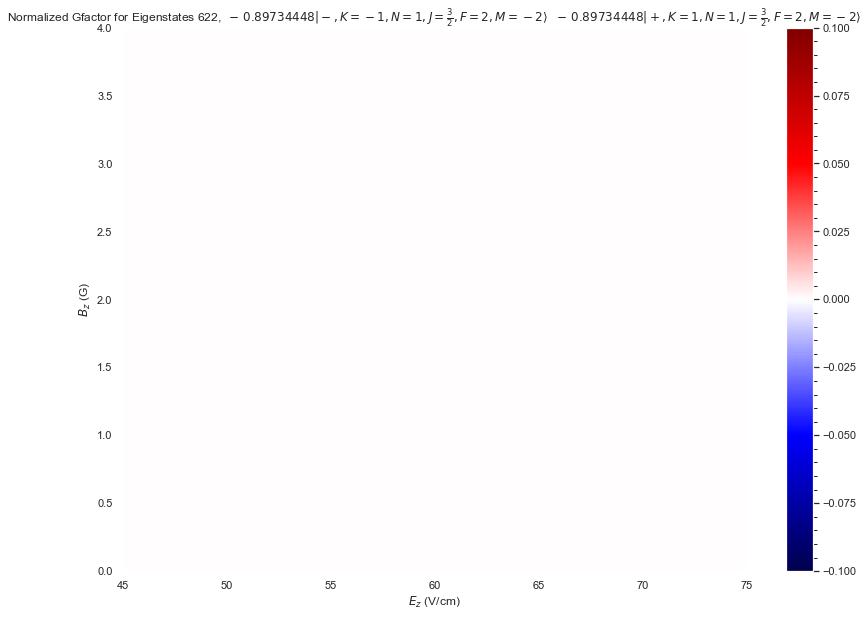

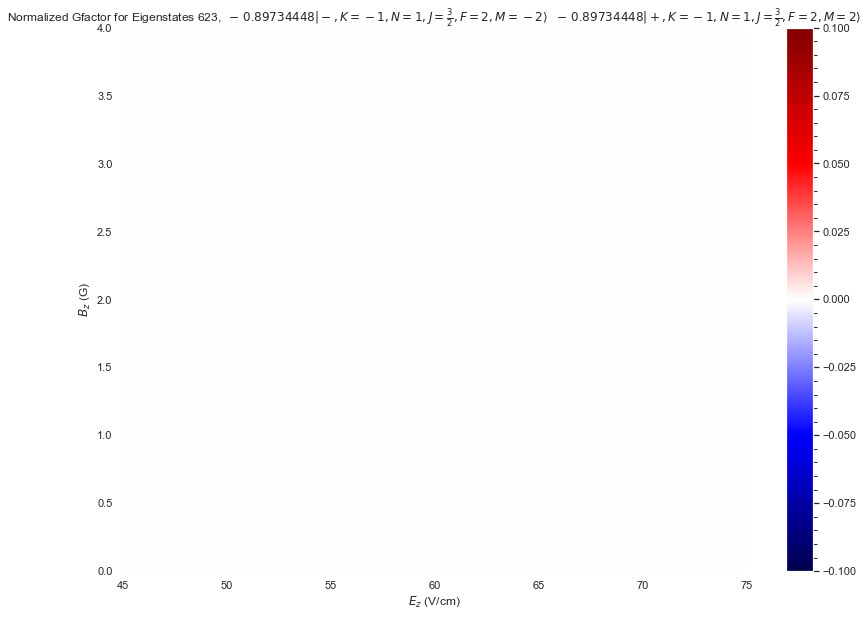

...

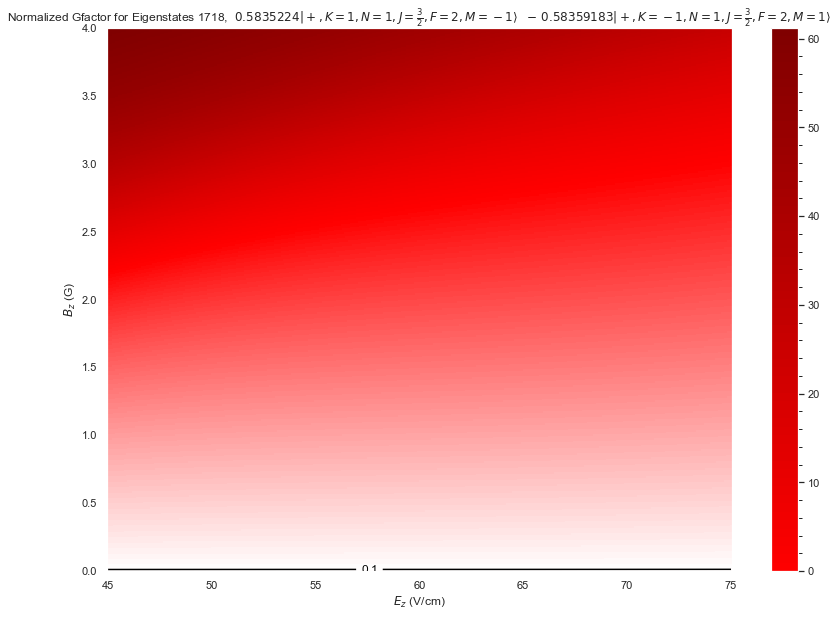

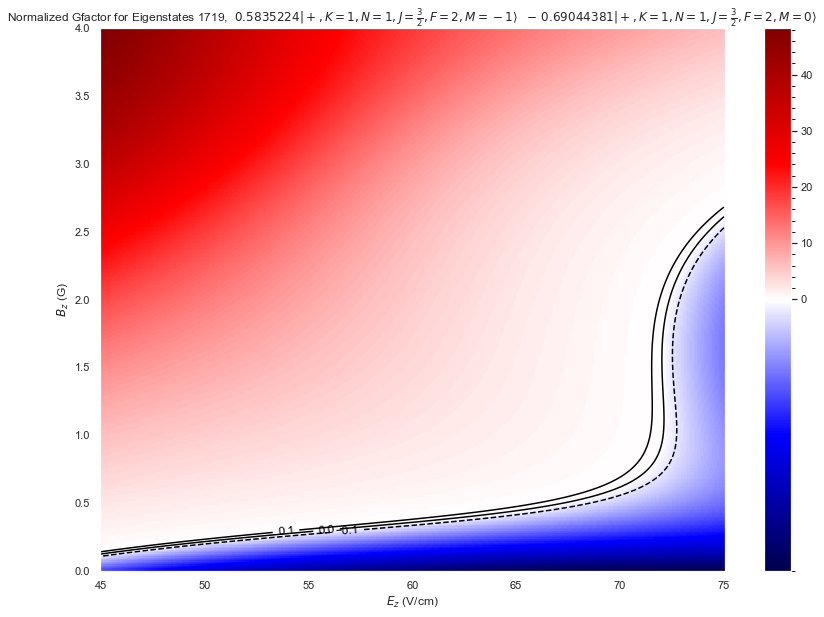

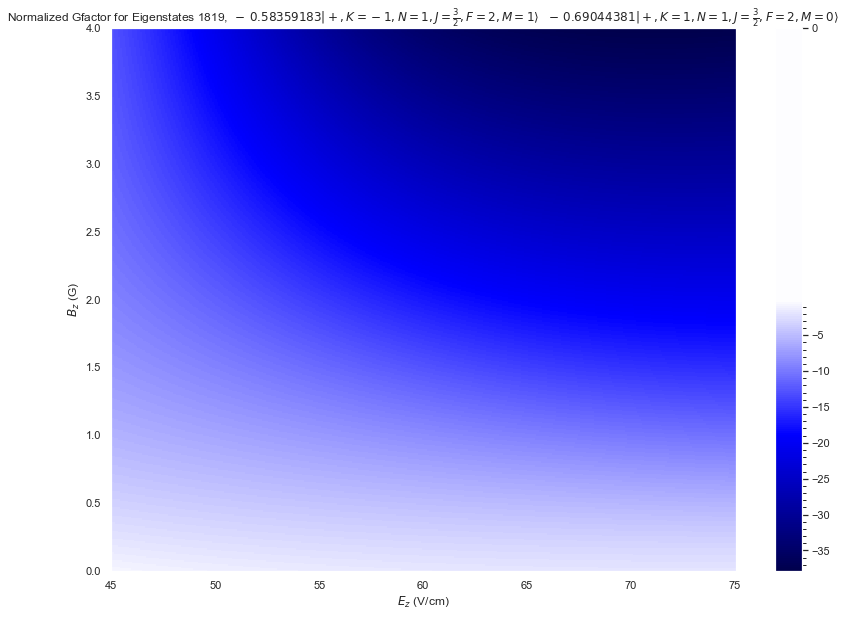

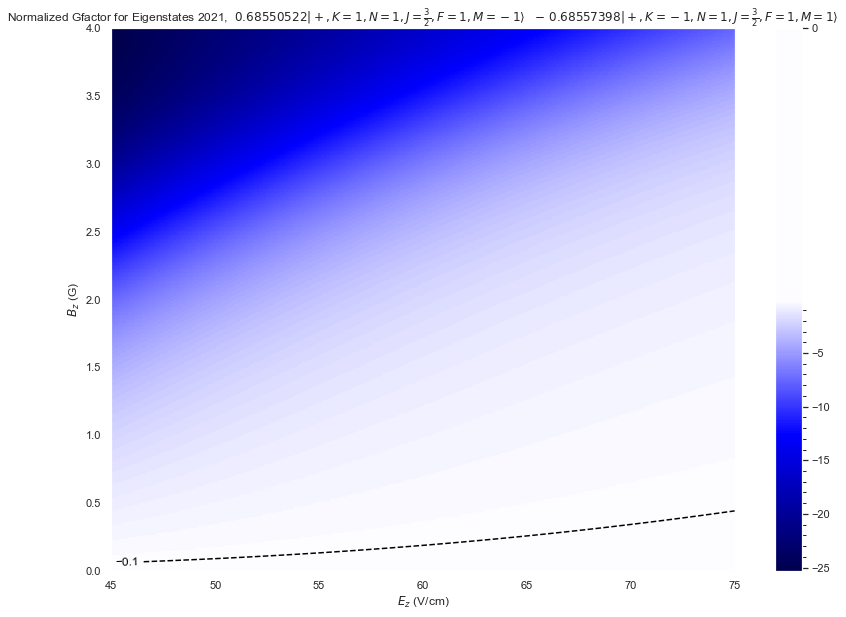

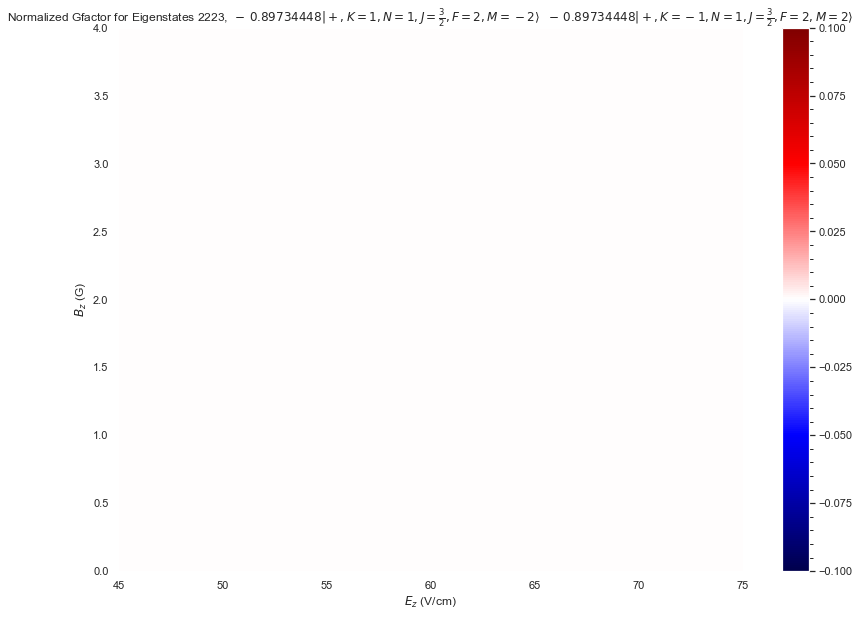

In [20]:
muBgS=1.399624494*2.0023/2
with_contour = True
evals_EB = N_state.shifts_EB
for i in range(len(evals_EB)):
    for j in range(i,len(evals_EB)):
        if i==j:
            continue
        if abs(evals_EB[i,0,0]-evals_EB[j,0,0])>1:
            continue
        plt.figure(figsize=(14,10))
        geff = evals_EB[i]-evals_EB[j]
        plt.grid(False)
        plt.pcolormesh(*mesh,geff,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vcenter=0))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title(r'Normalized Gfactor for Eigenstates {}{}, {} {}'.format(i,j,N_state.gen_state_str(i,single=True,parity=True),N_state.gen_state_str(j,single=True,parity=True)))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [2]:
read = False
date = '20220503'
folder = r'JSON_data/'
N=1

if read:
    state_dict = {}
    eval_dict = {}
    evec_dict = {}
    PTV_dict = {}
#     for M in range(-(N+1),N+2,1):
    for M in [-1,1]:
        M_state = MoleculeLevels.initialize_state('CaOH','40','X010',[N],M_values = 'custom',I=[0,1/2],S=1/2,round=10,M_range=[M],P_values=[1/2,3/2])
        state_dict[M] = M_state
        print(M)
        eval_dict[M] = get_json_data(folder+'X010_CaOH_N{}_M{}_EB_grid_evals_{}'.format(N,M,date),numpy=True)
        PTV_dict[M] = get_json_data(folder+'X010_CaOH_N{}_M{}_EB_grid_PTV_{}'.format(N,M,date),numpy=True)
        evec_dict[M] = get_json_data(folder+'X010_CaOH_N{}_M{}_EB_grid_evecs_{}'.format(N,M,date),numpy=True)
    mesh = get_json_data(folder+'X010_CaOH_N{}_EzBz_grid_{}'.format(N,date),numpy=True)

NameError: name 'MoleculeLevels' is not defined

In [29]:
save=True
date = '20220520'
folder = r'JSON_data/'
N=N
if save:
    for M in eval_dict.keys():
            save_json_data(eval_dict[M].tolist(),folder+'X010_CaOH_N{}_M{}_EB_grid_evals_fulltrap_{}'.format(N,M,date))
            save_json_data(PTV_dict[M].tolist(),folder+'X010_CaOH_N{}_M{}_EB_grid_PTV_fulltrap_{}'.format(N,M,date))
            save_json_data(evec_dict[M].tolist(),folder+'X010_CaOH_N{}_M{}_EB_grid_evecs_fulltrap_{}'.format(N,M,date))
    mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))
    save_json_data(mesh.tolist(),folder+'X010_CaOH_N{}_EzBz_grid_{}'.format(N,date))
Ez = mesh[0,:,0]
Bz = mesh[1,0,:]

Data saved to JSON_data/X010_CaOH_N2_M-3_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-3_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-3_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-2_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-2_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-2_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-1_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-1_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M-1_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M0_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M0_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M0_EB_grid_evecs_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M1_EB_grid_evals_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M1_EB_grid_PTV_20220503.json
Data saved to JSON_data/X010_CaOH_N2_M1_EB_grid_e

In [18]:
mesh = get_json_data(folder+'X010_CaOH_N{}_EzBz_grid_{}'.format(N,date),numpy=True)
Ez = mesh[0,:,0]
Bz = mesh[1,0,:]


-1


C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/4137279930.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


1


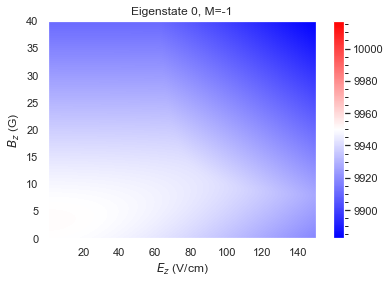

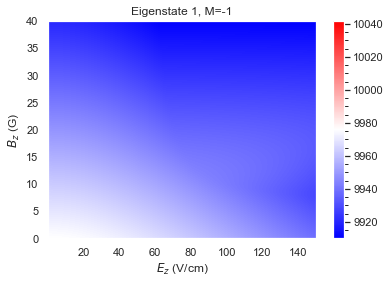

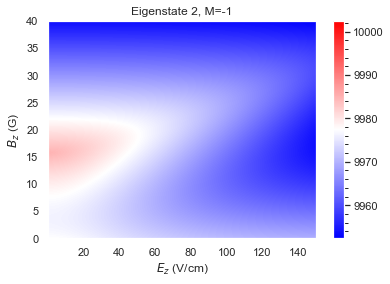

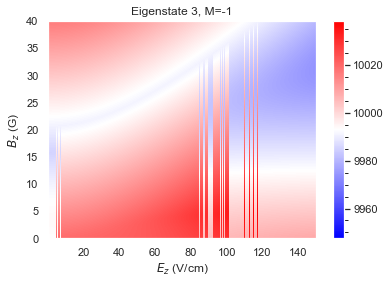

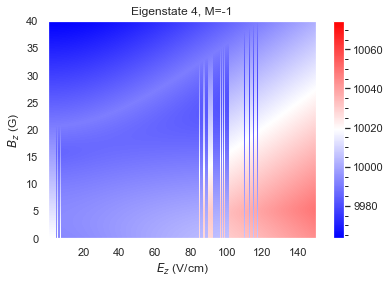

...

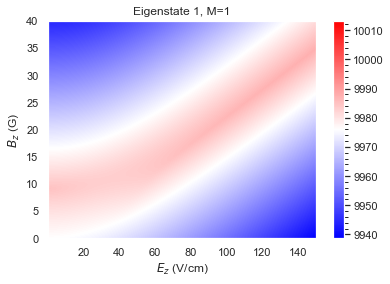

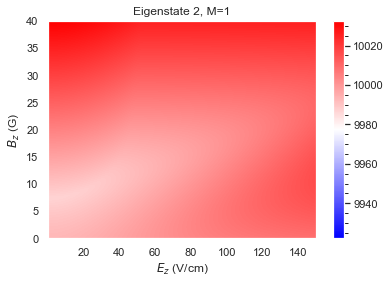

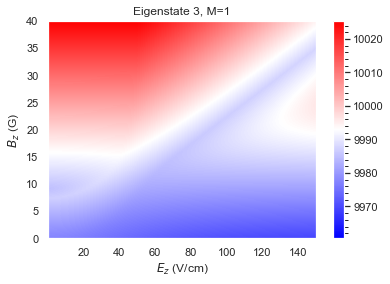

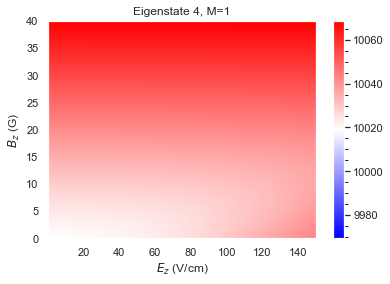

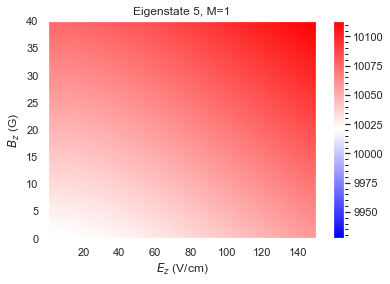

In [125]:
for M in eval_dict.keys():
    print(M)
    evals_EB = eval_dict[M]
    for i in range(len(evals_EB)):
        plt.figure()
        E0 = evals_EB[i][0,0]
        max_delta = max(abs(evals_EB[i].max()-E0),abs(evals_EB[i].min()-E0))
        plt.grid(False)
        plt.pcolormesh(*mesh,evals_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=E0,vmin=E0-max_delta,vmax=E0+max_delta))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [ ]:
for M in eval_dict.keys():
    print(M)
    evals_EB = eval_dict[M]
    for i in range(len(evals_EB)):
        plt.figure()
        E0 = evals_EB[i][0,0]
        max_delta = max(abs(evals_EB[i].max()-E0),abs(evals_EB[i].min()-E0))
        plt.grid(False)
        plt.pcolormesh(*mesh,evals_EB[i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=E0,vmin=E0-max_delta,vmax=E0+max_delta))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [31]:
(Bz[-1]-Bz[-2])

0.019999999999999574

-1


C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/2066369027.py:15: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


1


C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/2066369027.py:19: UserWarning: No contour levels were found within the data range.
  conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))


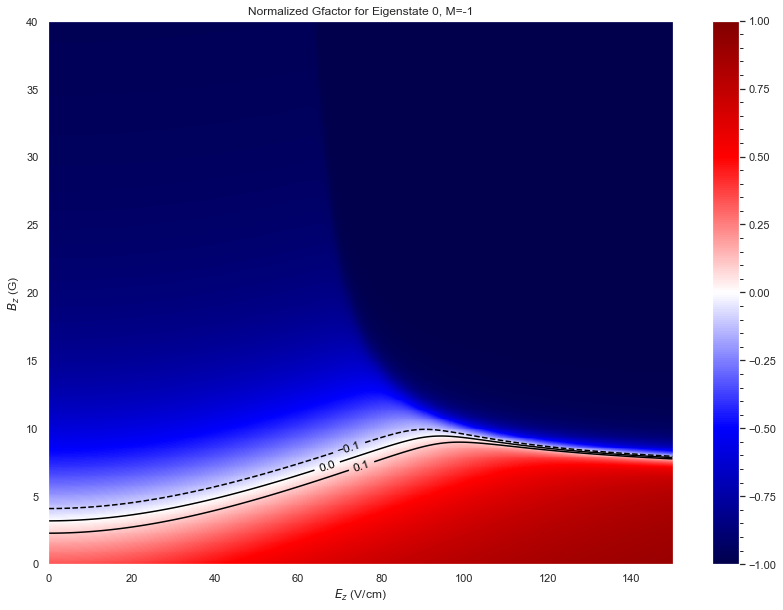

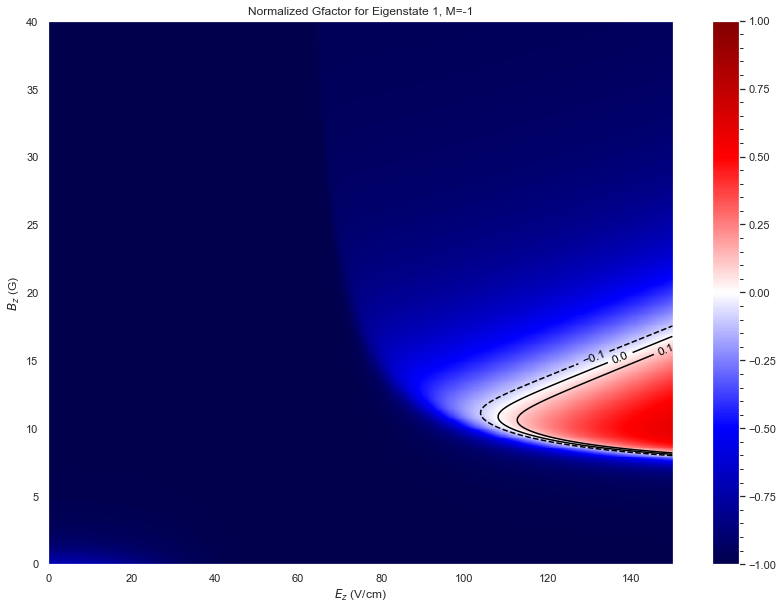

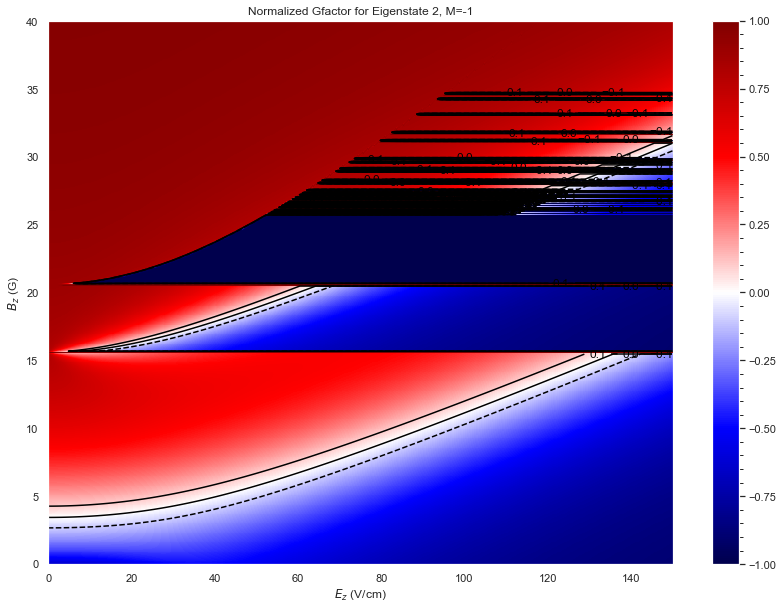

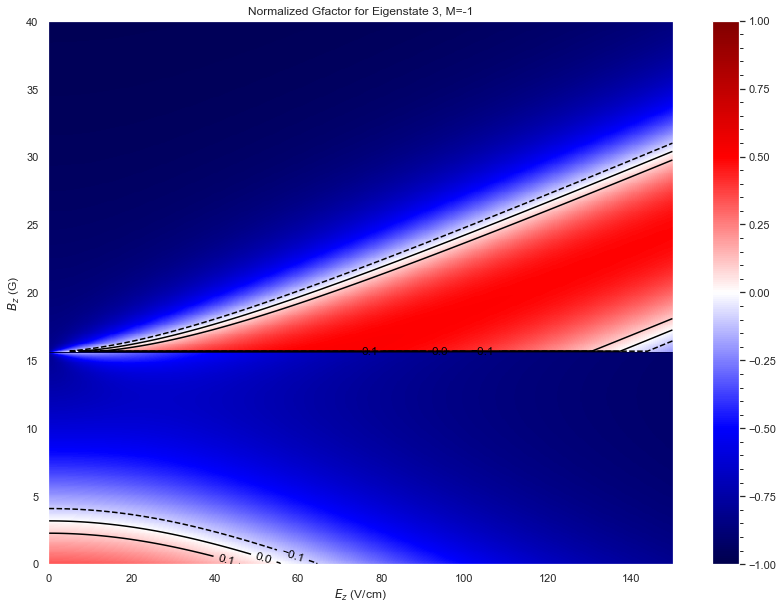

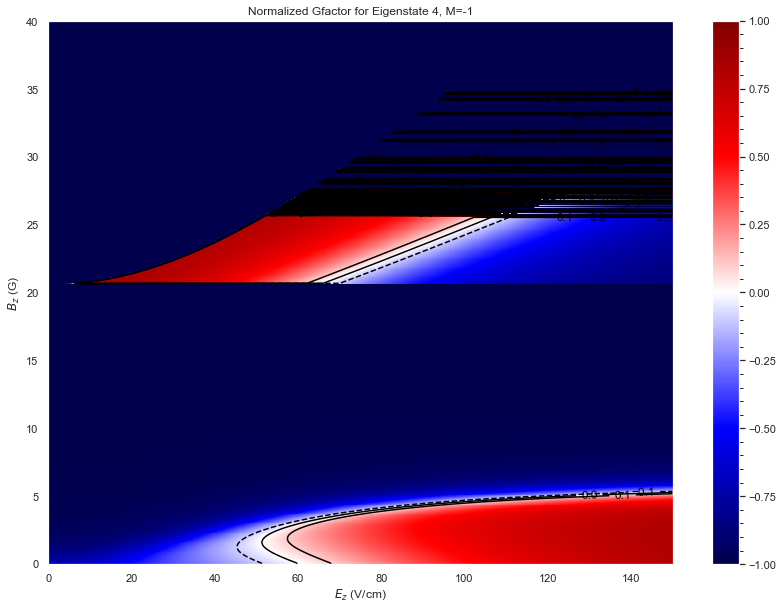

...

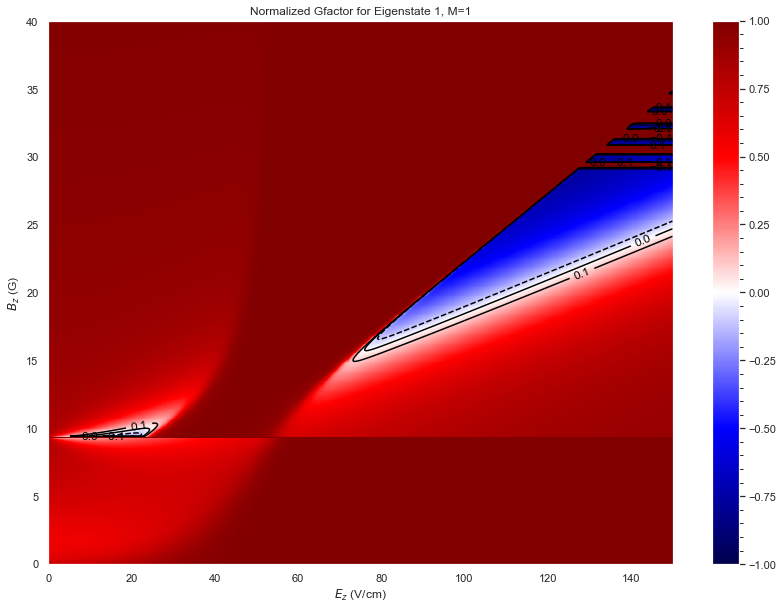

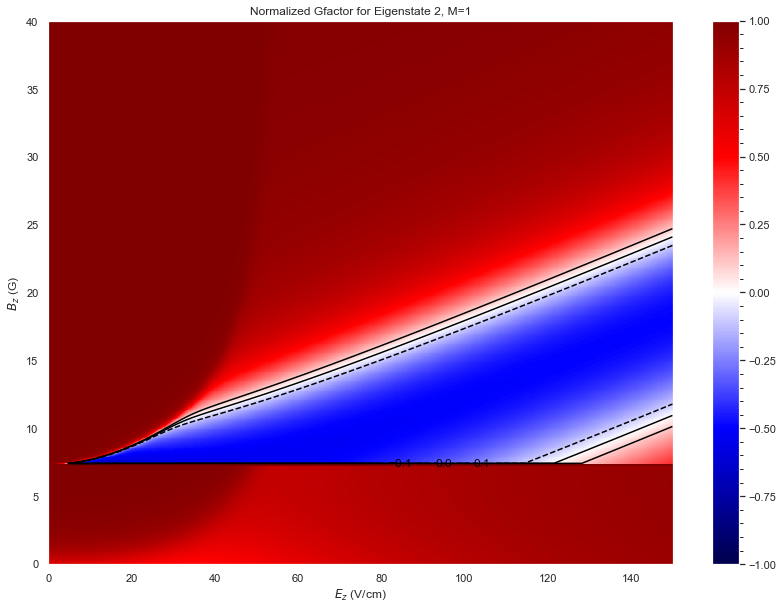

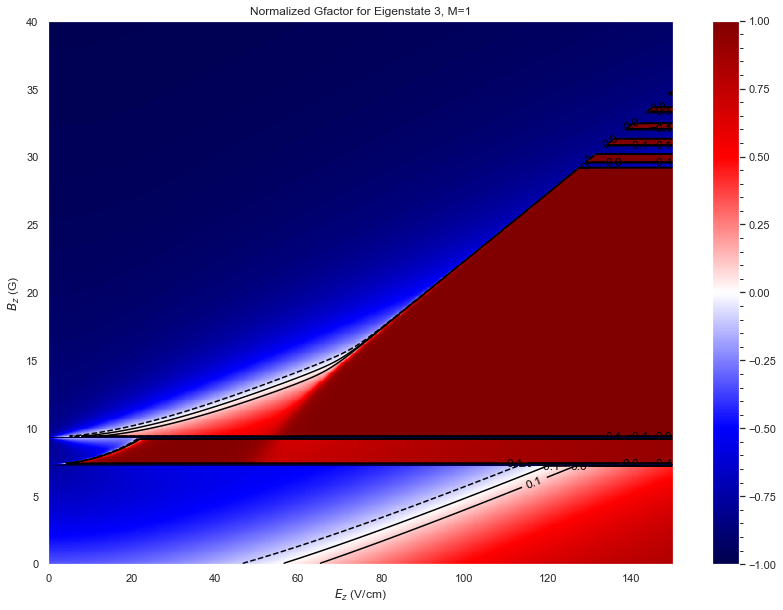

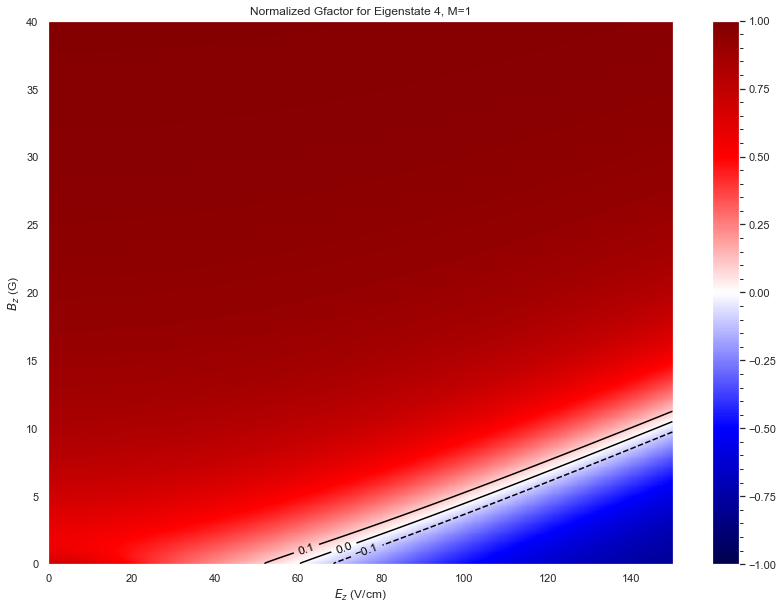

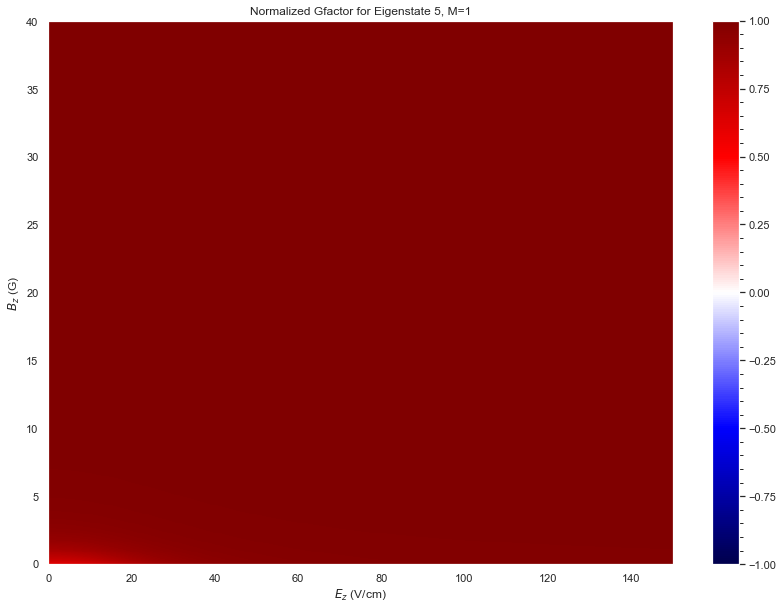

In [59]:
muBgS=1.399624494*2.0023/2
with_contour = True
for M in eval_dict.keys():
    print(M)
#     if M<0:
#         continue
#     if M!=1:
#         continue
    evals_EB = eval_dict[M]#-eval_dict[-M]
    for i in range(len(evals_EB)):
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i])[1]/abs(Bz[-1]-Bz[-2])
        plt.grid(False)
        plt.pcolormesh(*mesh,geff/muBgS,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title('Normalized Gfactor for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

-1
1


C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/3353355774.py:15: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


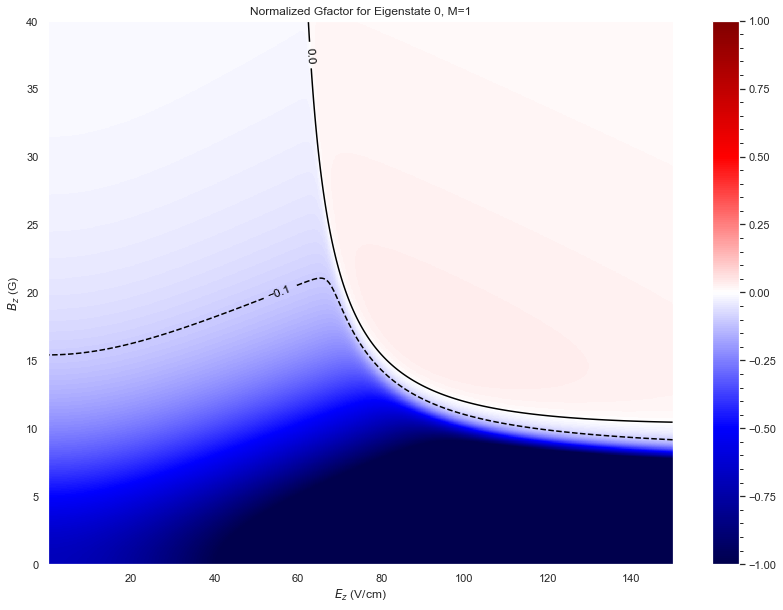

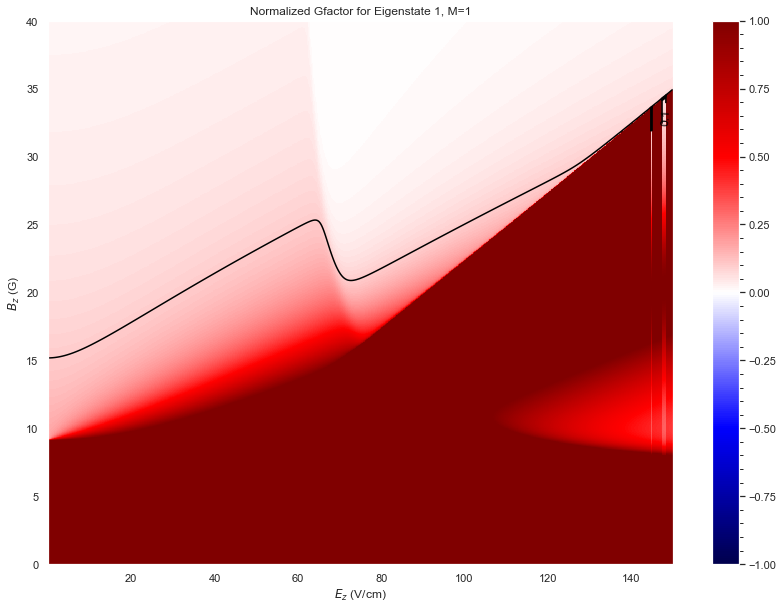

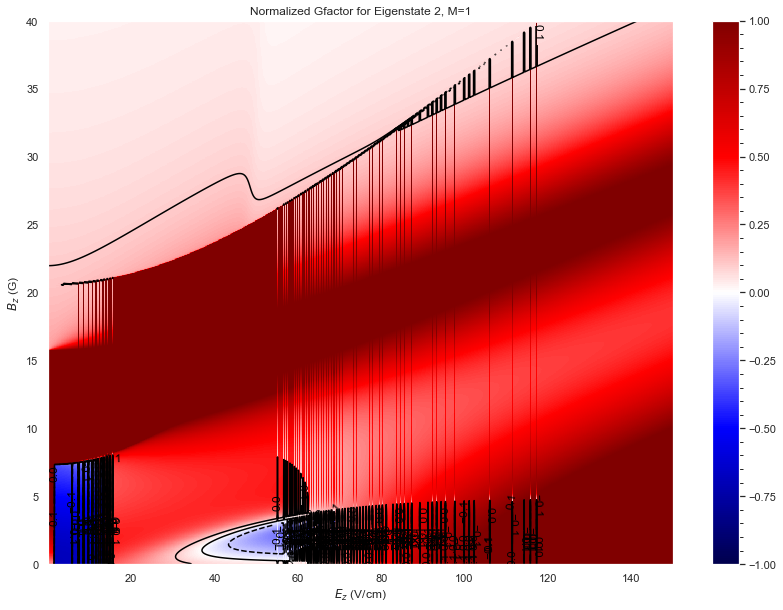

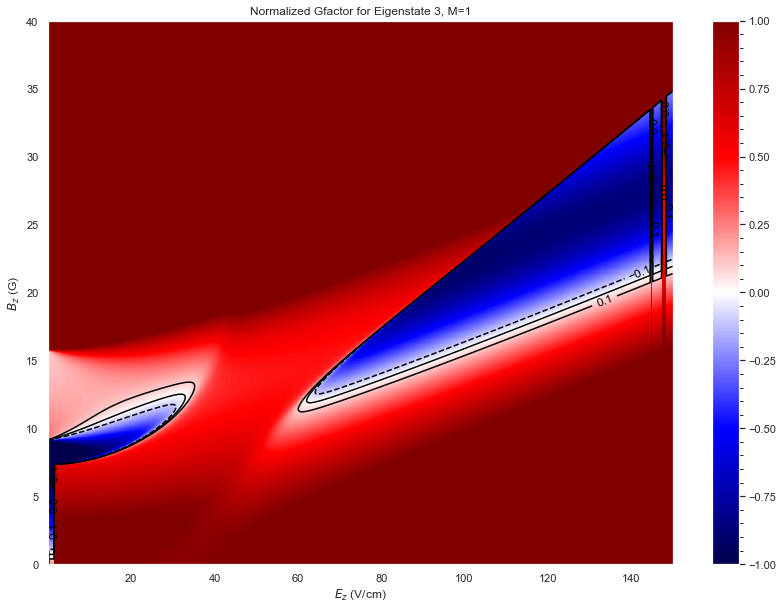

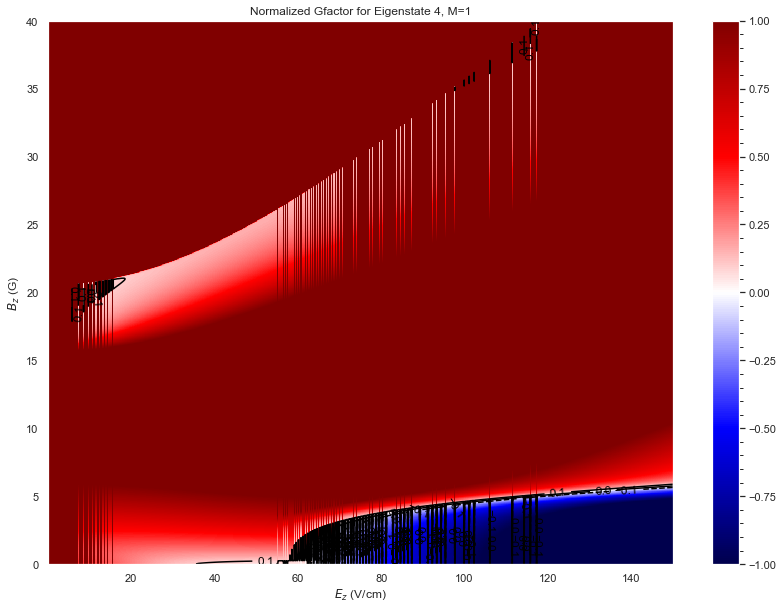

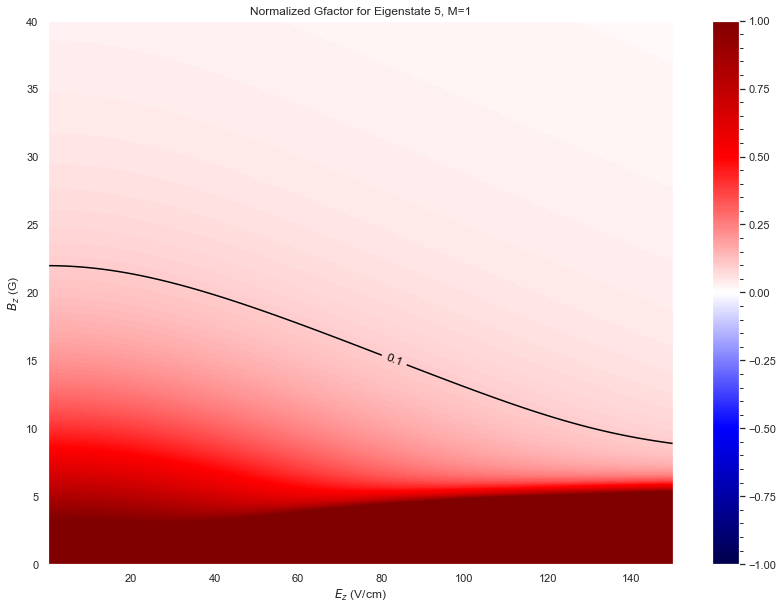

In [70]:
muBgS=1.399624494*2.0023/2
with_contour = True
for M in eval_dict.keys():
    print(M)
    if M<0:
        continue
    if M!=1:
        continue
    evals_EB = eval_dict[M]-eval_dict[-M]
    for i in range(len(evals_EB)):
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i])[1]/abs(Bz[-1]-Bz[-2])
        plt.grid(False)
        plt.pcolormesh(*mesh,geff/muBgS,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title('Normalized Gfactor for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

-1
1


C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17600/2133429930.py:15: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


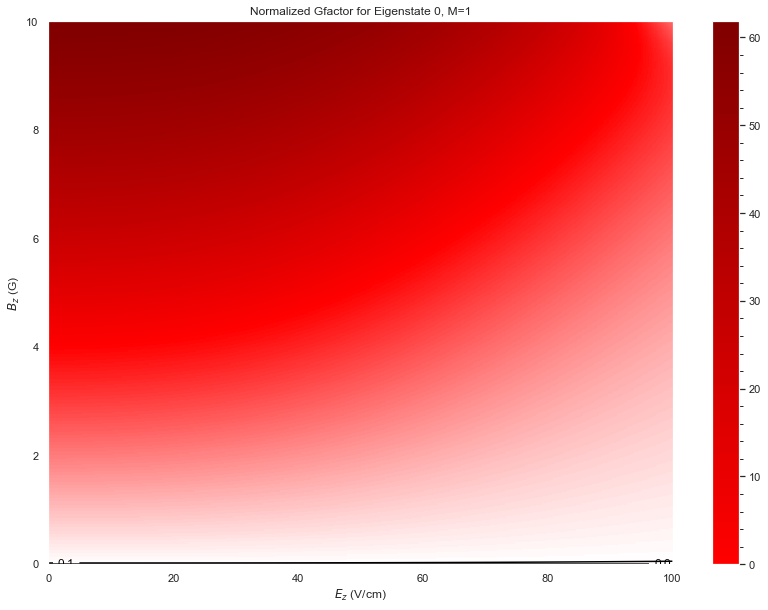

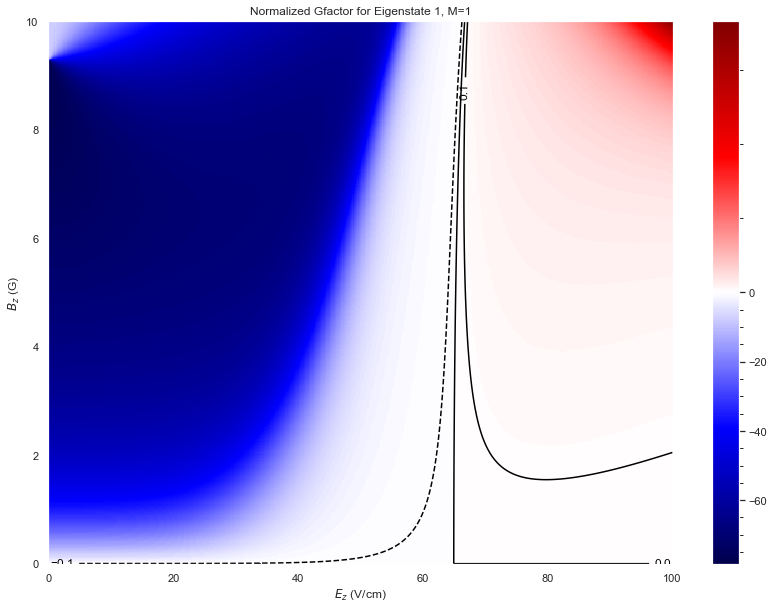

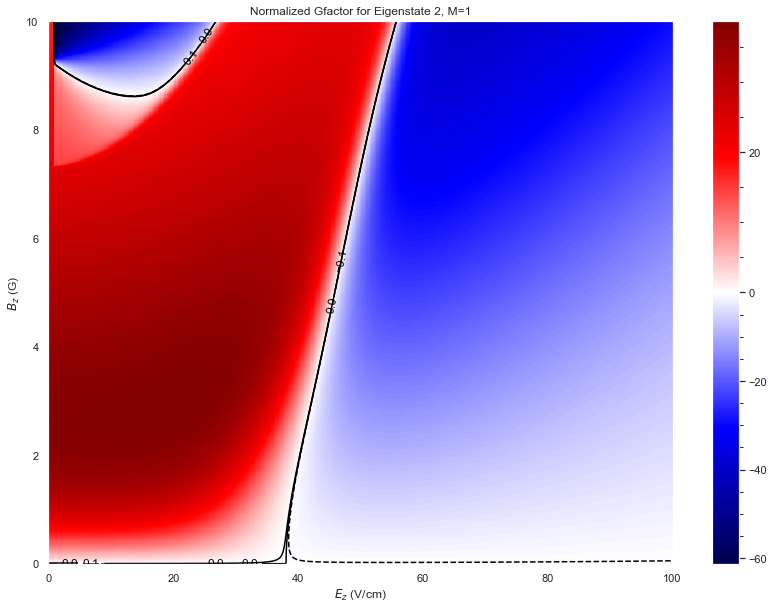

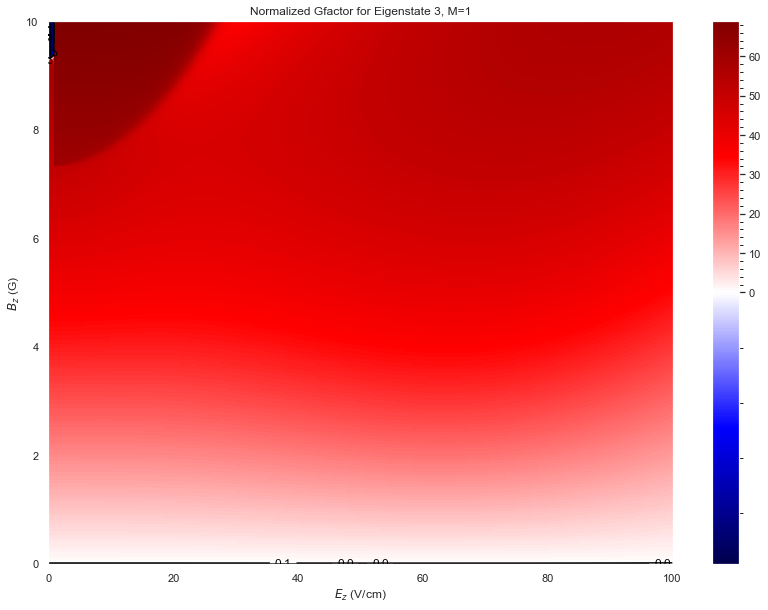

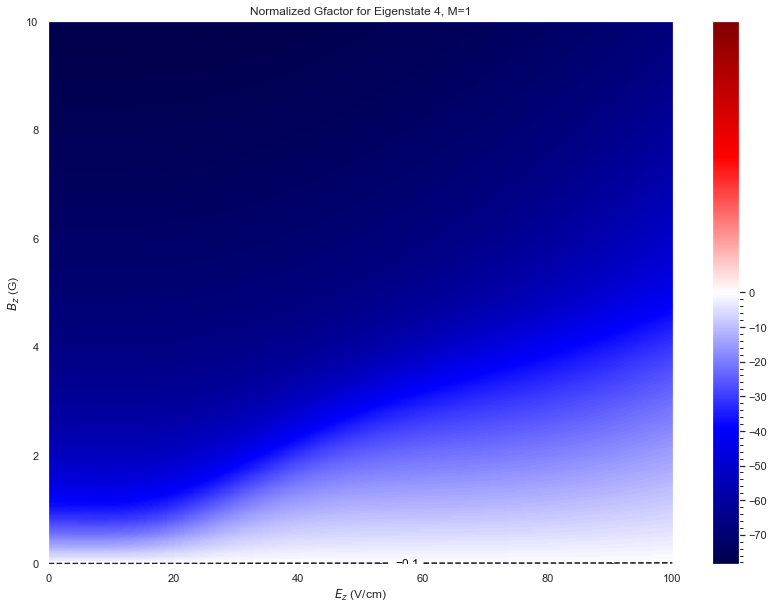

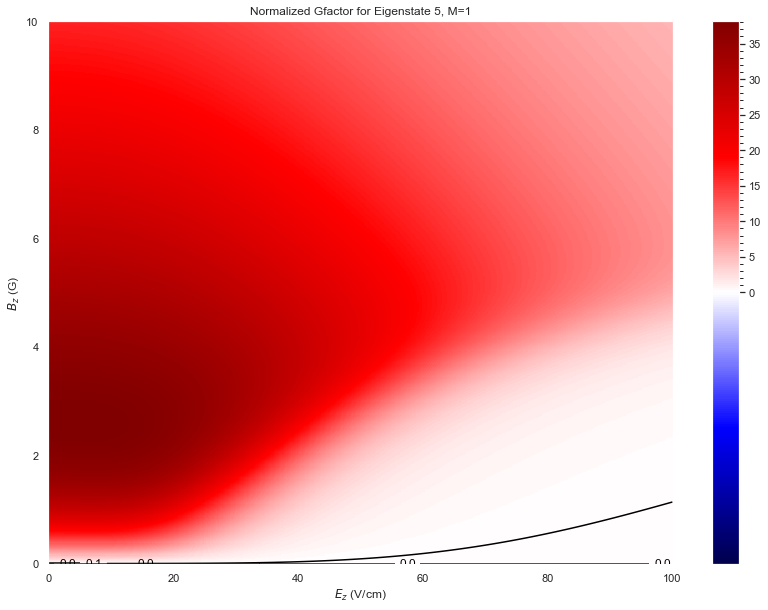

In [105]:
muBgS=1.399624494*2.0023/2
with_contour = True
for M in eval_dict.keys():
    print(M)
    if M<0:
        continue
    if M!=1:
        continue
    shifts_EB = trap_dict[M]-trap_dict[-M]
    for i in range(len(shifts_EB)):
        plt.figure(figsize=(14,10))
#         geff = np.gradient(shifts_EB[i])[1]
        plt.grid(False)
        plt.pcolormesh(*mesh,shifts_EB[i],shading='auto',cmap='seismic',norm=TwoSlopeNorm(vcenter=0))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,shifts_EB[i],colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title('Normalized Gfactor for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [57]:
state_dict[1].eigensystem(0,0);

In [58]:
for i in [3,4]:
    state_dict[1].write_state(i)
    print(state_dict[1].parities[i],'\n')

E = 9986.754047712182 MHz

 -0.706467651155211 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 -0.7064676511551992 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 0.02954478051767774 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 0.029544780517685186 |K=1,N=1,J=1.5,F=1.0,M=1.0> 

 -0.005528455065333993 |K=-1,N=1,J=1.5,F=2.0,M=1.0> 

 -0.005528455065335371 |K=1,N=1,J=1.5,F=2.0,M=1.0> 

1.0 

E = 10012.688824443263 MHz

 0.028894065694727473 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 0.028894065694725718 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 0.7033701651989319 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 0.7033701651989319 |K=1,N=1,J=1.5,F=1.0,M=1.0> 

 0.06659987744477819 |K=-1,N=1,J=1.5,F=2.0,M=1.0> 

 0.06659987744472823 |K=1,N=1,J=1.5,F=2.0,M=1.0> 

1.0 



In [20]:
state_N

NameError: name 'state_N' is not defined

In [ ]:
muBgS=1.399624494*2.0023/2
with_contour = True
evals_EB = evals_N
for i in range(len(evals_EB)):
    for j in range(i,len(evals_EB)):
        if i==j:
            continue
        if abs(evals_EB[i][0,0]-evals_EB[j][0,0])>1:
            continue
        plt.figure(figsize=(14,10))
        geff = np.gradient(evals_EB[i]-evals_EB[j])[1]/abs(Bz[-1]-Bz[-2])
        plt.grid(False)
        plt.pcolormesh(*mesh,geff/muBgS,shading='auto',cmap='seismic',norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))#,vmin=-1,vmax=1)
        cbar = plt.colorbar()
        cbar.minorticks_on()
        if with_contour:
            try:
                conmap = plt.contour(*mesh,geff/muBgS,colors='black',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
                plt.clabel(conmap, inline=True, fontsize=12)
    #             cbar = plt.colorbar()
    #             cbar.minorticks_on()
            except ValueError:
                print("Can't plot this data")
        plt.title(r'Normalized Gfactor for Eigenstates {}{}, {} {}'.format(i,j,N_state.gen_state_str(i,single=True,parity=True),N_state.gen_state_str(j,single=True,parity=True)))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17936/2840049904.py:15: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17936/2840049904.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(14,10))


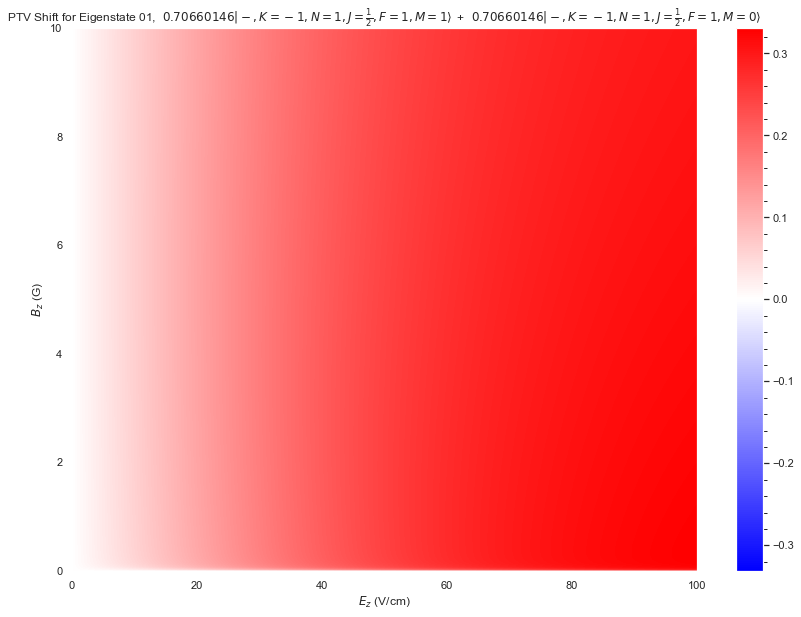

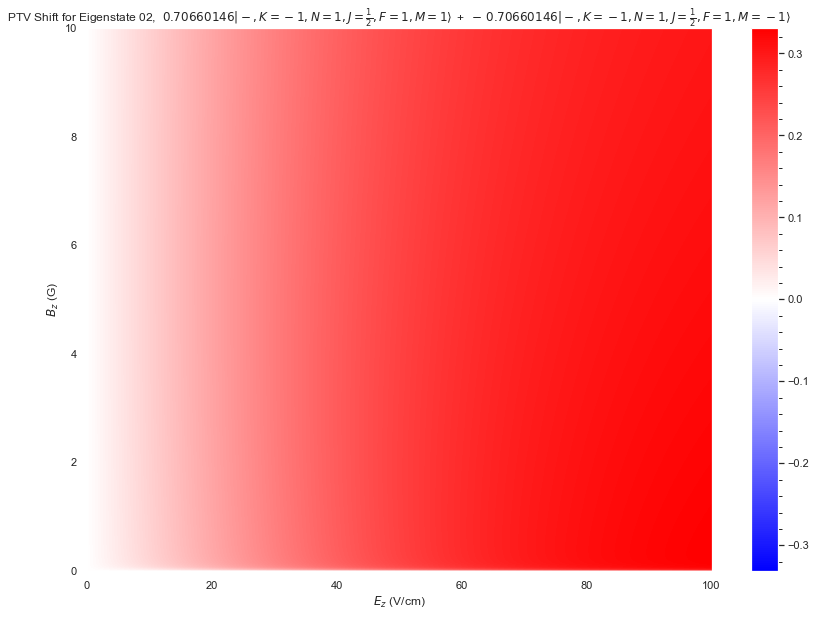

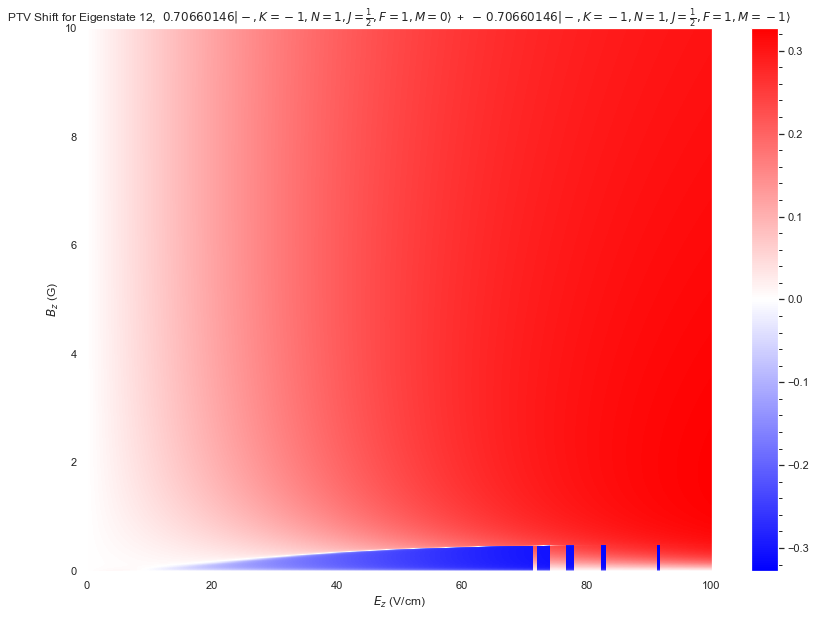

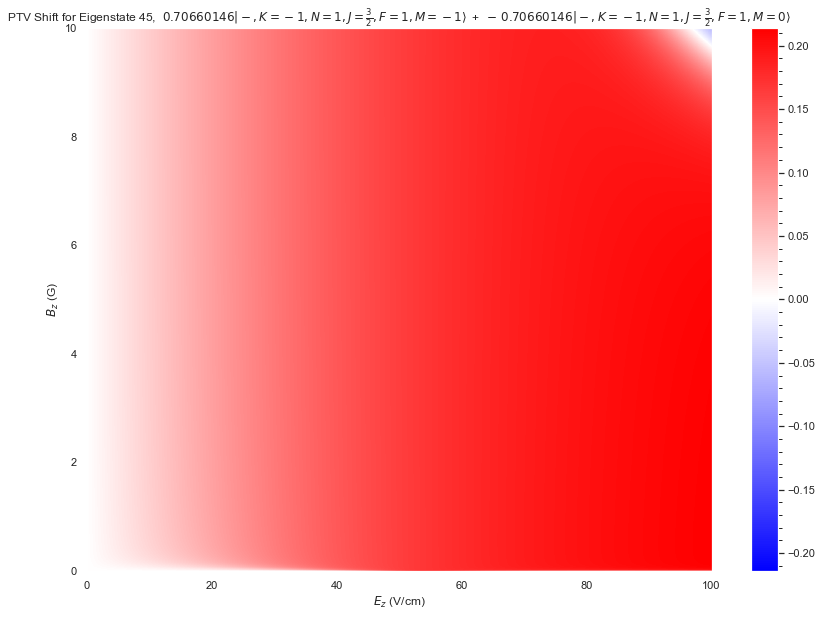

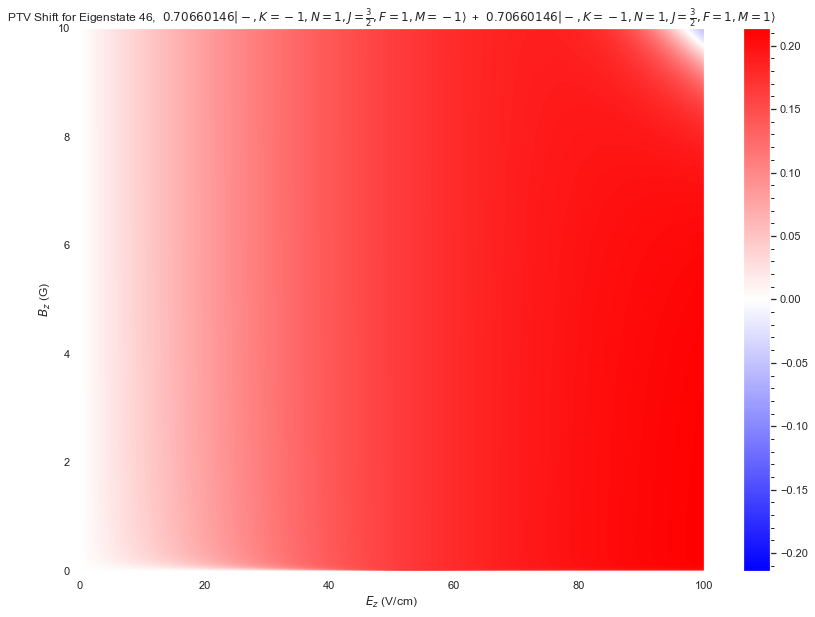

...

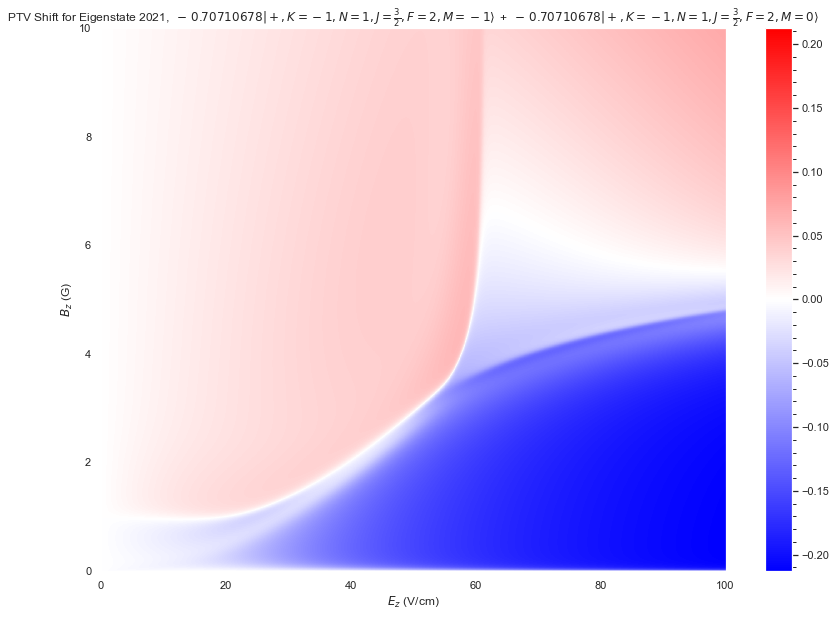

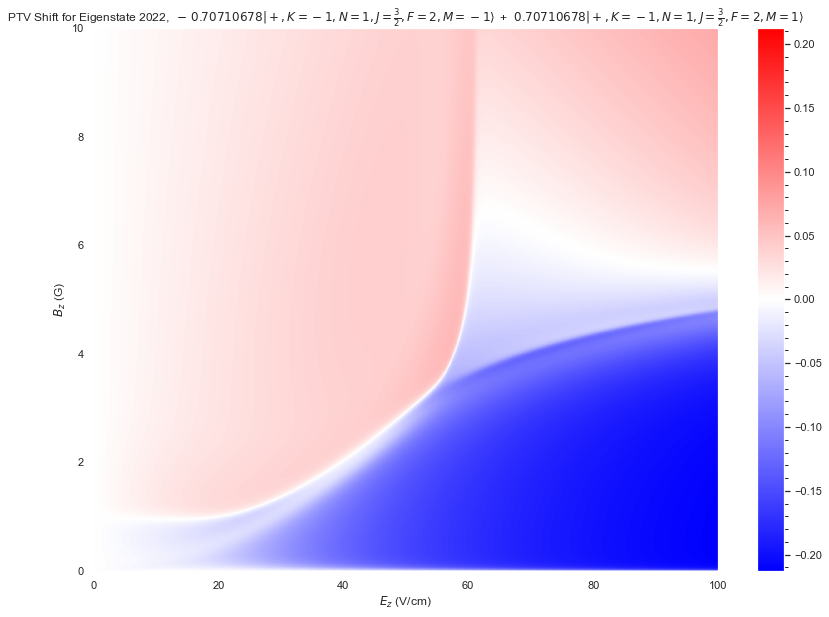

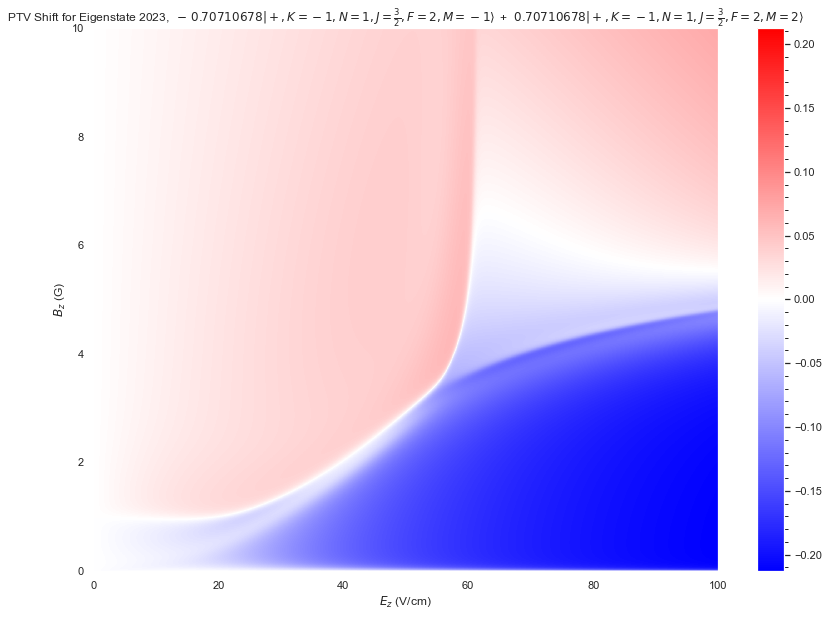

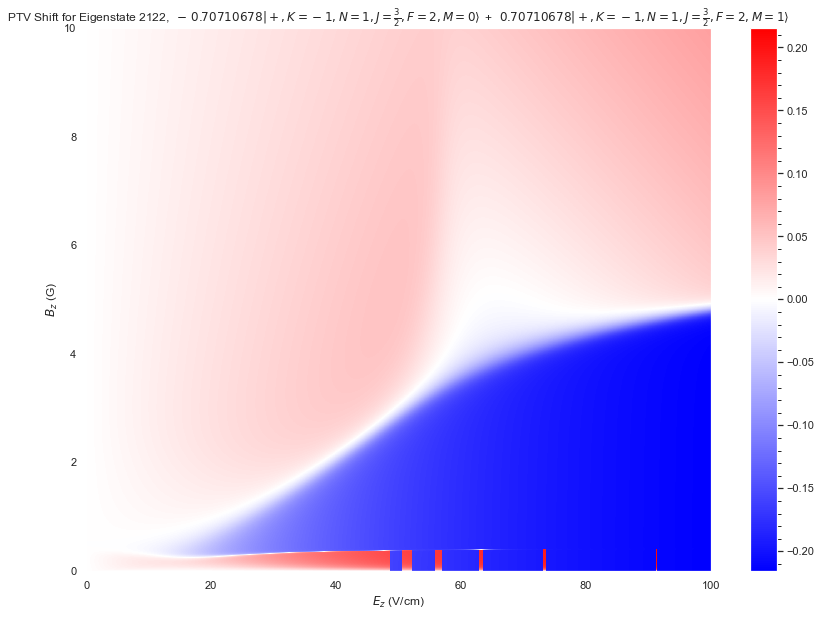

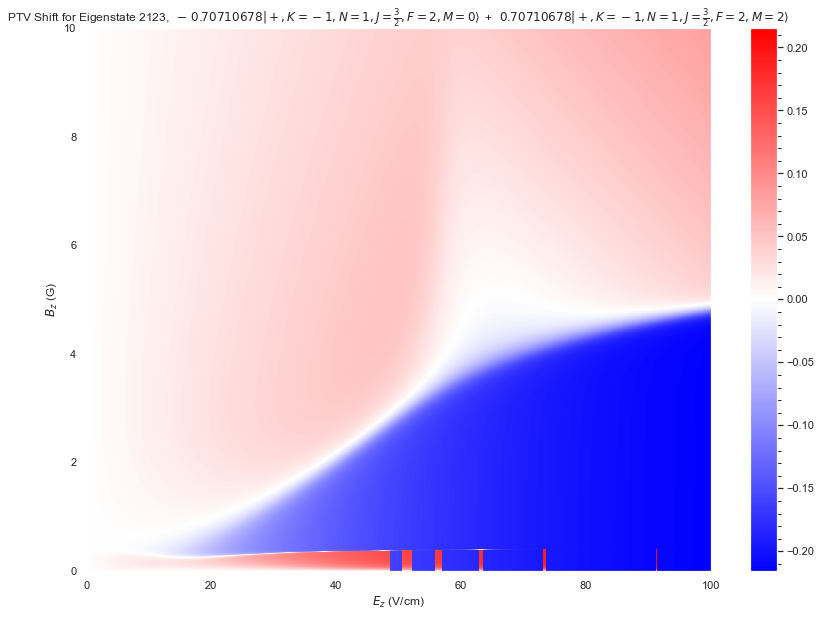

In [ ]:
PTV_EB = PTV_N
for i in range(len(PTV_EB)):
    for j in range(i,len(PTV_EB)):
        if i==j:
            continue
        if abs(evals_EB[i][0,0]-evals_EB[j][0,0])>1:
            continue
        plt.figure(figsize=(14,10))
        PTV = PTV_EB[i]
        max_delta = max(abs(PTV.max()),abs(PTV.min()))
        if PTV.max()==PTV.min():
            max_delta = 0.1
        plt.grid(False)
        plt.pcolormesh(*mesh,PTV,shading='auto',cmap='bwr',norm=TwoSlopeNorm(vmin=-max_delta,vcenter=0,vmax=max_delta))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('PTV Shift for Eigenstate {}{}, {} + {}'.format(i,j,N_state.gen_state_str(i,single=True,parity=True),N_state.gen_state_str(j,single=True,parity=True)))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

-2
-1
0
1


C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_14276/2957537644.py:16: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


2


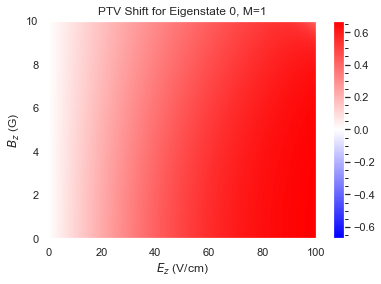

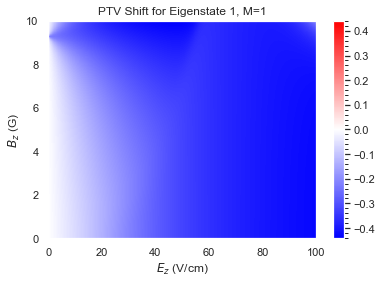

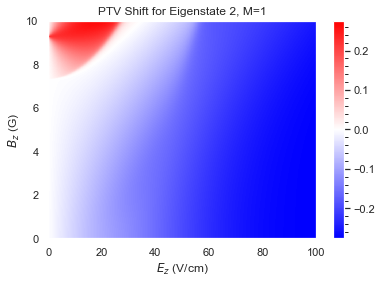

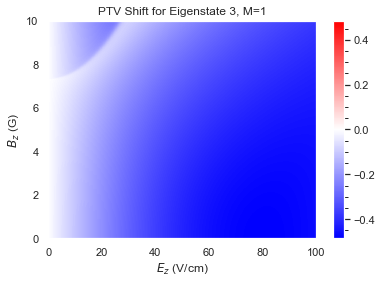

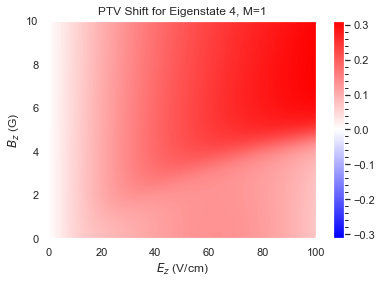

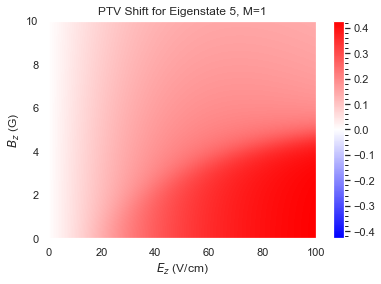

In [33]:
for M in eval_dict.keys():
    print(M)
#     if M>0:
#         continue
    if M!=1:
        continue
    PTV_EB = PTV_dict[M]-PTV_dict[-M]
    for i in range(len(PTV_EB)):
        plt.figure()
        PTV = PTV_EB[i]
        max_delta = max(abs(PTV.max()),abs(PTV.min()))
        if PTV.max()==PTV.min():
            max_delta = 0.1
        plt.grid(False)
        plt.pcolormesh(*mesh,PTV,shading='auto',cmap='bwr',norm=TwoSlopeNorm(vmin=-max_delta,vcenter=0,vmax=max_delta))
        cbar = plt.colorbar()
        cbar.minorticks_on()
        plt.title('PTV Shift for Eigenstate {}, M={}'.format(i,M))
        plt.xlabel(r'$E_z$ (V/cm)')
        plt.ylabel(r'$B_z$ (G)')

In [42]:
evals_EB.shape

(2, 1201, 1001)

In [159]:
np.searchsorted(Ez,390)

1950

In [164]:
np.argmin(abs(np.gradient(evals_EB[7])[1][:,0]))

2241

In [204]:
Ez = mesh[0,:,0]
Bz = mesh[1,0,:]

In [59]:
from scipy.optimize import curve_fit

def fitFunction(xscale,data,function,guess,sigma,plot,bounds=None):
    xscale = np.array(xscale)
    data = np.array(data)
    guess = np.array(guess).astype(float)
    if bounds==None:
        bounds = (-np.inf,np.inf)
    try:
        popt,pcov = curve_fit(function,xscale,data,p0=guess,sigma=sigma,bounds=bounds)
        perr = np.round(np.sqrt((np.diag(pcov))),decimals=6)
        params = np.round(popt,decimals=6)
        fit = function(xscale,*popt)
        residuals = data - fit
        if plot:
            plotFitComparison(xscale,data,function,params,sigma)
            plotFitResiduals(xscale,residuals,sigma)
    except RuntimeError:
        print("Error - curve_fit failed")
        print(guess)
        plt.figure()
        plt.plot(xscale,data)
        plt.plot(xscale,function(xscale,*guess))
        params = []
        perr = []
        residuals = []
    return [params,perr,residuals]

def plotFitComparison(xscale,data,function,params,sigma,xlabel=None,ylabel=None):
    plt.figure()
    plt.title('Fit vs Data')
    if sigma is None:
        plt.plot(xscale,data,label='Data',marker='o')
    else:
        plt.errorbar(xscale,data,yerr=sigma,label='Data',marker='o',linestyle='None')
    plt.plot(xscale,function(xscale,*params),label='Fit')
    return

def plotFitResiduals(xscale,residuals,sigma):
    plt.figure()
    plt.title('Fit Residuals')
    if sigma is None:
        plt.plot(xscale,residuals,'o',linestyle='None')
    else:
        plt.errorbar(xscale,residuals,yerr=sigma,marker='o',linestyle='None')
    plt.plot(xscale,np.zeros(len(xscale)),linestyle='--')
    return

def quadratic(x,a,b):
    return a*x**2+b

def line(x,m,b):
    return m*x+b

def fitQuad(xscale, data,guess=[1,0],sigma=None,plot=True,verbose=False):
    function = quadratic
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('a = {} +/- {}'.format(params[0],error[0]))
        print('b = {} +/- {}'.format(params[1],error[1]))
    return [params,error,residuals]

def fitLine(xscale, data,guess=[1,0],sigma=None,plot=True,verbose=False):
    function = line
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('m = {} +/- {}'.format(params[0],error[0]))
        print('b = {} +/- {}'.format(params[1],error[1]))
    return [params,error,residuals]

a = 0.00229 +/- 0.0
b = 0.000152 +/- 0.0


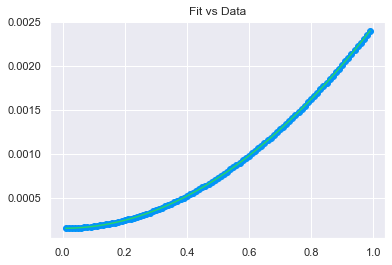

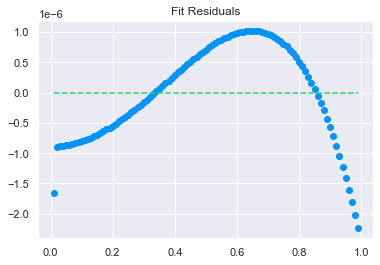

In [58]:
params,err,resid = fitQuad(Bz[1:100],(np.gradient(EB)[1][iE,1:100])/(Bz[-1]-Bz[-2]),verbose=True)

-1
1
60.79999999999586


Text(0.5, 1.0, 'Differential g-Factor, N=1,J=1/2+ M=1/-1')

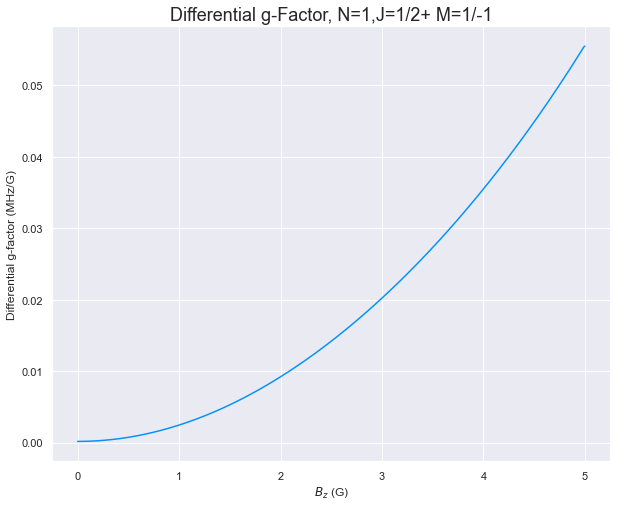

In [68]:
plt.figure(figsize=(10,8))
for M in eval_dict.keys():
    print(M)
    if M!=1:
        continue
    evals_EB = eval_dict[M]-eval_dict[-M]
    for i in range(len(evals_EB)):
        if i not in [3]:
            continue
        EB = evals_EB[i]
        iE = np.argmin(abs(np.gradient(EB)[1][:,0]))
        print(Ez[iE])
        plt.plot(Bz,np.gradient(EB)[1][iE,:]/(Bz[-1]-Bz[-2]))
#         plt.xlabel(r'$E_z$ (V/cm)')
plt.xlabel(r'$B_z$ (G)')
plt.ylabel('Differential g-factor (MHz/G)')
plt.title('Differential g-Factor, N=1,J=1/2+ M=1/-1',fontsize=18)

m = 0.031909 +/- 5e-06
b = -1.939903 +/- 0.000286


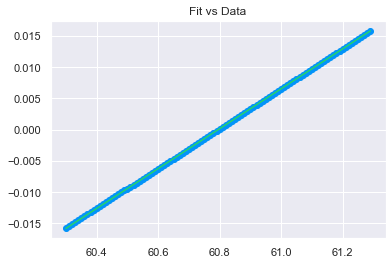

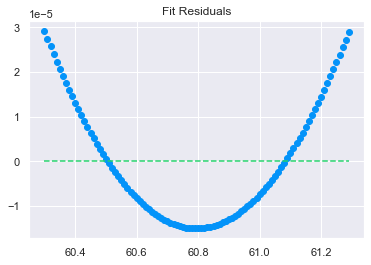

In [61]:
params,err,resid = fitLine(Ez[iE-50:iE+50],(np.gradient(EB)[1][iE-50:iE+50,0])/(Bz[-1]-Bz[-2]),verbose=True)

-1
1
60.79999999999586
Slope = 0.031908400342224676 /(V/cm)


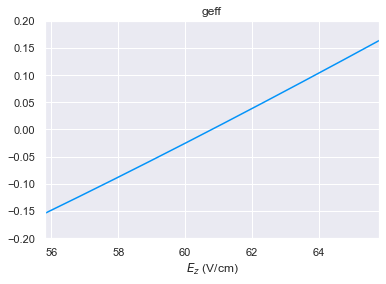

In [46]:
plt.figure()
for M in eval_dict.keys():
    print(M)
    if M!=1:
        continue
    evals_EB = eval_dict[M]-eval_dict[-M]
    for i in range(len(evals_EB)):
        if i not in [3]:
            continue
        EB = evals_EB[i]
        iE = np.argmin(abs(np.gradient(EB)[1][:,0]))
        print(Ez[iE])
        plt.plot(Ez,np.gradient(EB)[1][:,0]/(Bz[-1]-Bz[-2]))
#         plt.xlabel(r'$E_z$ (V/cm)')
plt.xlabel(r'$E_z$ (V/cm)')
plt.title('geff')
plt.xlim(55.8,65.8)
plt.ylim(-0.2,0.2)
slope = ((np.gradient(EB)[1][iE+100,0]-np.gradient(EB)[1][iE-100,0])/(Bz[-1]-Bz[-2]))/(Ez[iE+100]-Ez[iE-100])
print('Slope =',slope,'/(V/cm)')

In [42]:
((np.gradient(EB)[1][iE+100,0]-np.gradient(EB)[1][iE-100,0])/(Bz[-1]-Bz[-2]))/(Ez[iE+100]-Ez[iE-100])

0.031908400342224676

In [57]:
np.gradient(EB)[0].shape

(1201, 1001)

In [96]:
eval_dict[0][3]-eval_dict[0][4]

array([[-15.94271, -15.94267, -15.94257, ..., -11.09706, -11.12208,
        -11.1471 ],
       [-15.94304, -15.943  , -15.9429 , ..., -11.09697, -11.12198,
        -11.147  ],
       [-15.94403, -15.944  , -15.9439 , ..., -11.09667, -11.12169,
        -11.14671],
       ...,
       [-40.21951, -40.21936, -40.21894, ..., -12.61294, -12.64068,
        -12.66841],
       [-40.21984, -40.2197 , -40.21928, ..., -12.61309, -12.64083,
        -12.66857],
       [-40.22018, -40.22004, -40.21962, ..., -12.61325, -12.64098,
        -12.66872]])

In [164]:
d = eval_dict[0][3]-eval_dict[0][4]
(abs(d)<0.1).any()

True

In [141]:
x = np.zeros((100,100))
y = np.zeros((100,100))+1
y[3:5,20:80] = 1

In [142]:
d = x-y
testmesh = np.array(np.meshgrid(np.arange(100),np.arange(100),indexing='ij'))

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/1015796236.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

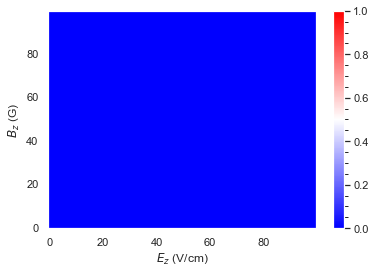

In [143]:
plt.figure()
plt.grid(False)
plt.pcolormesh(*testmesh,abs(d)<0.1,shading='auto',cmap='bwr',vmin=0,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

In [154]:
(abs(d)<0.1).nonzero()[0].size

0

In [158]:
len(eval_dict.keys())

5

In [96]:
E_thresh = 0.1
PTV_thresh = 0.05
geff_thresh = 0.1
evals_EB = evals_N
PTV_EB = PTV_N
Ez_idx_match = []
Bz_idx_match = []
eigenstate_match = []
for i in range(24):
    for j in range(i,24):
        evals_i = evals_EB[i]
        evals_j = evals_EB[j]
        PTV_i = PTV_EB[i]
        PTV_j = PTV_EB[j]
        if i==j:
            continue
        deltaE_ij = evals_i-evals_j
        E_bool_match = (abs(deltaE_ij)<E_thresh)
        if E_bool_match.any():
            geff_i = np.gradient(evals_i)[1]/(Bz[1]-Bz[0])
            geff_j = np.gradient(evals_j)[1]/(Bz[1]-Bz[0])
            deltag_ij = geff_i - geff_j
            g_bool_match = np.logical_and(abs(deltag_ij)<geff_thresh, E_bool_match)
            if g_bool_match.any():
                deltaPTV_ij = PTV_i - PTV_j
                PTV_bool_match = np.logical_and(abs(deltaPTV_ij)>PTV_thresh, g_bool_match)
                if PTV_bool_match.any():
                    #Found a match!
                    idx_match = PTV_bool_match.nonzero()
                    print('Found a match!')
                    print('i = {}'.format(i))
                    print('j = {}'.format(j))
                    print('Ez vals = {}'.format(Ez[idx_match[0]]))
                    print('Bz vals = {}'.format(Bz[idx_match[1]]))
                    print('delta geff = {}'.format(deltag_ij[idx_match]))
                    print('delta PTV = {}'.format(deltaPTV_ij[idx_match]))
                    Ez_idx_match.append(idx_match[0])
                    Bz_idx_match.append(idx_match[1])
                    eigenstate_match.append([i,j])

NameError: name 'PTV_N' is not defined

{-1: <Energy_Levels.MoleculeLevels at 0x14d00aed310>,
 1: <Energy_Levels.MoleculeLevels at 0x14d07949b20>}

In [97]:
E_thresh = 0.1
PTV_thresh = 0.05
geff_thresh = 0.01
Ez_idx_match = []
Bz_idx_match = []
eigenstate_match = []
M_match = []
M_list = list(eval_dict.keys())
for Midx in range(len(M_list)):
    Mi = M_list[Midx]
    for Mjdx in range(Midx,len(M_list)):
        Mj = M_list[Mjdx]
        if abs(Mi-Mj)>2:
            continue
        else:
            evals_Mi = eval_dict[Mi]
            evals_Mj = eval_dict[Mj]
            PTV_Mi = PTV_dict[Mi]
            PTV_Mj = PTV_dict[Mj]
            for i in range(len(evals_Mi)):
                for j in range(i,len(evals_Mj)):
                    if i==j and Mi==Mj:
                        continue
                    deltaE_ij = evals_Mi[i]-evals_Mj[j]
                    E_bool_match = (abs(deltaE_ij)<E_thresh)
                    if E_bool_match.any():
                        geff_i = np.gradient(evals_Mi[i])[1]/(Bz[1]-Bz[0])
                        geff_j = np.gradient(evals_Mj[j])[1]/(Bz[1]-Bz[0])
                        deltag_ij = geff_i - geff_j
                        g_bool_match = np.logical_and(abs(deltag_ij)<geff_thresh, E_bool_match)
                        if g_bool_match.any():
                            PTV_i = PTV_Mi[i]
                            PTV_j = PTV_Mj[j]
                            deltaPTV_ij = PTV_i - PTV_j
                            PTV_bool_match = np.logical_and(abs(deltaPTV_ij)>PTV_thresh, g_bool_match)
                            if PTV_bool_match.any():
                                #Found a match!
                                idx_match = PTV_bool_match.nonzero()
                                print('Found a match!')
                                print('i = {}, Mi = {}'.format(i,Mi))
                                print('j = {}, Mj = {}'.format(j,Mj))
                                print('Ez vals = {}'.format(Ez[idx_match[0]]))
                                print('Bz vals = {}'.format(Bz[idx_match[1]]))
                                print('delta geff = {}'.format(deltag_ij[idx_match]))
                                print('delta PTV = {}'.format(deltaPTV_ij[idx_match]))
                                print('delta E = {}'.format(deltaE_ij[idx_match]))
                                Ez_idx_match.append(idx_match[0])
                                Bz_idx_match.append(idx_match[1])
                                eigenstate_match.append([i,j])
                                M_match.append([Mi,Mj])

Found a match!
i = 3, Mi = -1
j = 3, Mj = 1
Ez vals = [55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.
 55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.
 55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.
 55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.  55.2 55.2 55.2
 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2
 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2
 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2
 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.2 55.4
 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4
 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4
 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4
 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4
 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.4 55.6 55.6 55.6 55.6 55.6 55.6
 55.6 55.6 55.6 55.6 55.6 

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_13244/1796785351.py:12: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_13244/1796785351.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

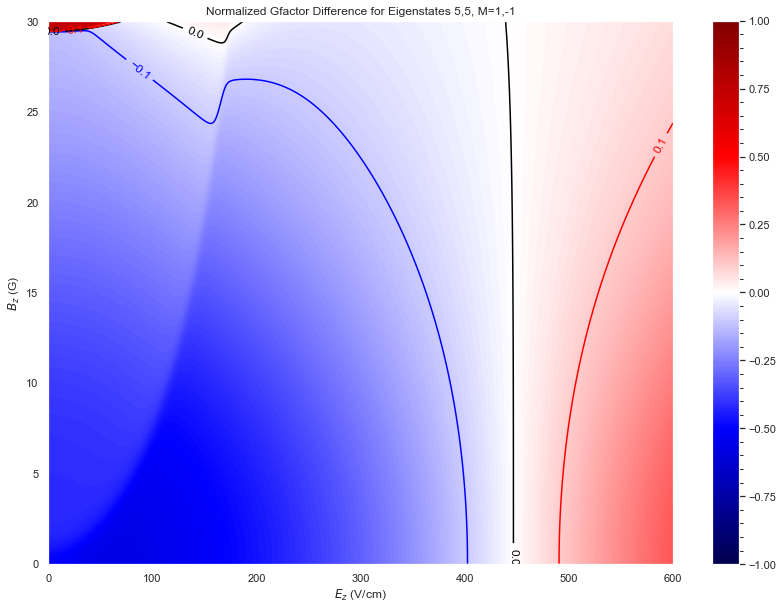

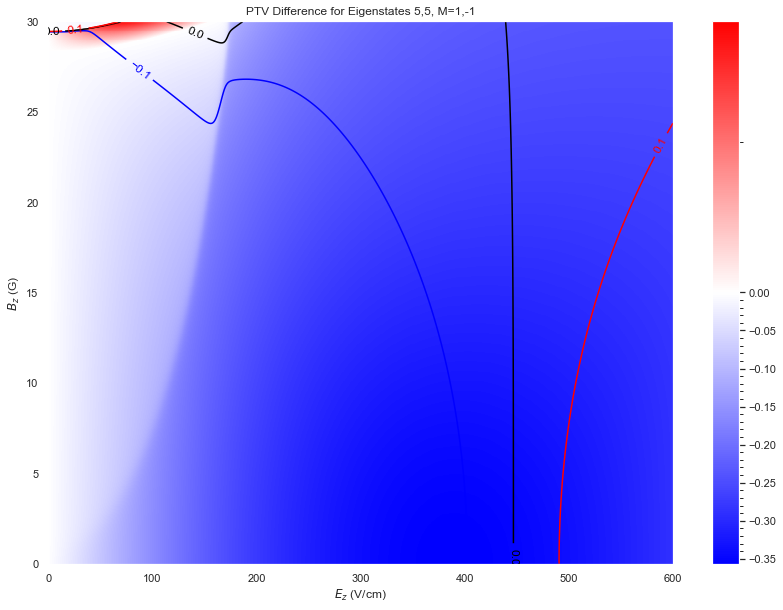

In [191]:
muBgS=1.399624494*2.0023/2
with_contour = True
idx = 5
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_geff/(2*muBgS),shading='auto',cmap='seismic',vmin=-1,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

PTV_1 = PTV_dict[1][idx]
PTV_2 = PTV_dict[-1][idx]
plt.figure(figsize=(14,10))
delta_PTV = PTV_1 - PTV_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_PTV,shading='auto',cmap='bwr',norm=TwoSlopeNorm(vcenter=0.0))
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('PTV Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/1155249723.py:12: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()
C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/1155249723.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


Text(0, 0.5, '$B_z$ (G)')

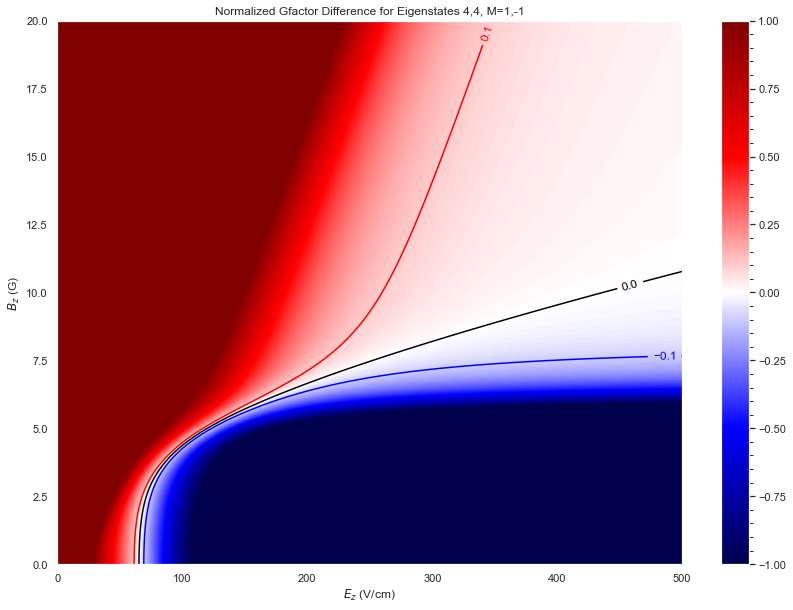

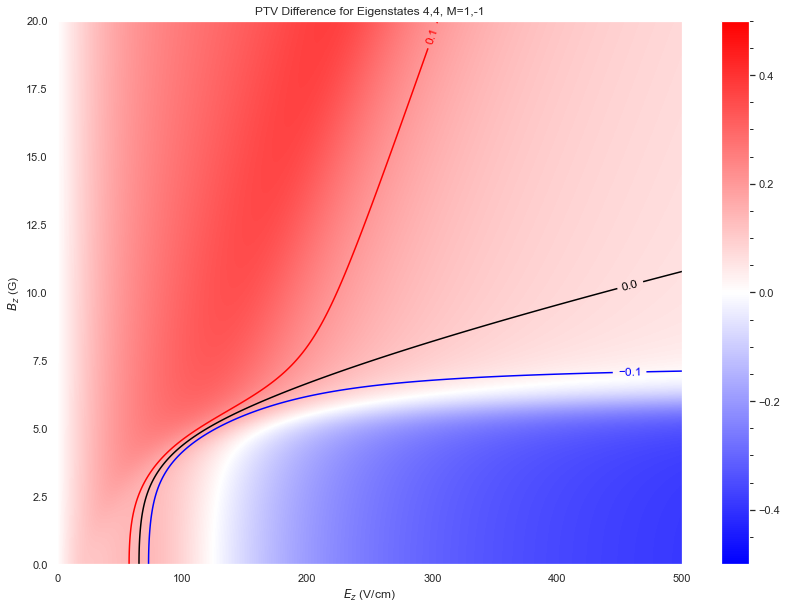

In [372]:
muBgS=1.399624494*2.0023/2
with_contour = True
idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/muBgS,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

PTV_1 = PTV_dict[1][idx]
PTV_2 = PTV_dict[-1][idx]
plt.figure(figsize=(14,10))
delta_PTV = PTV_1 - PTV_2
plt.grid(False)
plt.pcolormesh(*mesh,delta_PTV,shading='auto',cmap='bwr',vmin=-0.5,vmax=0.5)
cbar = plt.colorbar()
cbar.minorticks_on()
if with_contour:
    try:
        conmap = plt.contour(*mesh,delta_geff/(2*muBgS),colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap, inline=True, fontsize=12)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('PTV Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

In [270]:
Em = np.searchsorted(Ez,40)
Em

160

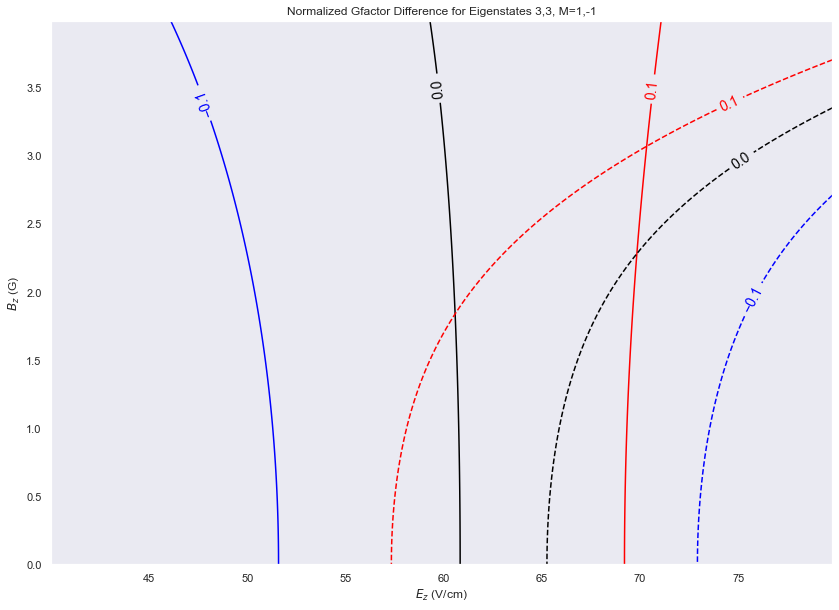

In [377]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,4)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5, fontsize=14,rightside_up=False,manual=[(50,3.5),(60,3.5),(70,3.5)])
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5,fontsize=14,rightside_up=True,manual=[(75,3.25),(75,3),(75,2)])
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")

In [392]:
np.linspace(-0.1,0.1,21)

array([-0.1 , -0.09, -0.08, -0.07, -0.06, -0.05, -0.04, -0.03, -0.02,
       -0.01,  0.  ,  0.01,  0.02,  0.03,  0.04,  0.05,  0.06,  0.07,
        0.08,  0.09,  0.1 ])

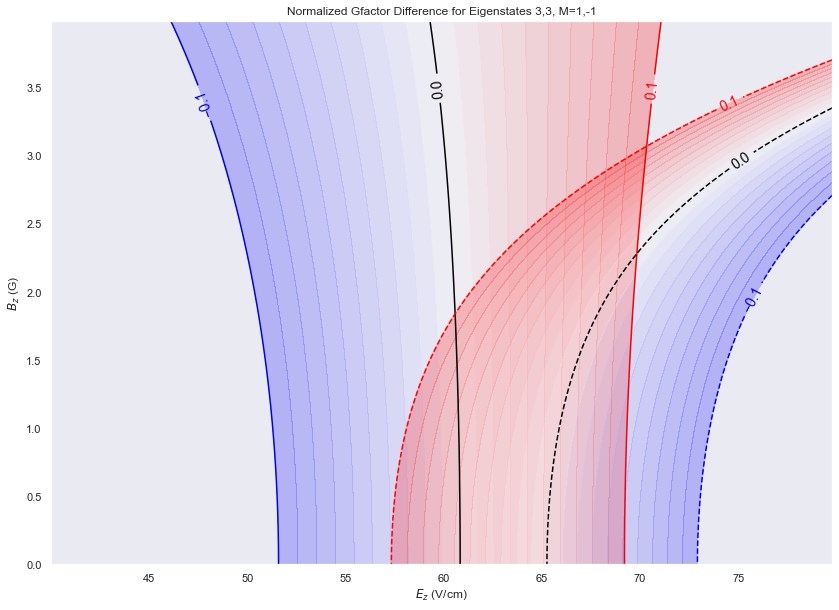

In [393]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,4)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# PTV_1 = PTV_dict[1][idx]
# PTV_2 = PTV_dict[-1][idx]
# delta_PTV = PTV_1 - PTV_2
# plt.contourf(*mesh[:,s1,s2],delta_PTV[s1,s2],levels=10,cmap='cool')
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5,manual=[(50,3.5),(60,3.5),(70,3.5)], fontsize=14,rightside_up=False)
        smallmap1 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5, manual=[(75,3.25),(75,3),(75,2)],fontsize=14,rightside_up=True)
        smallmap2 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',linestyles='dashed',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")

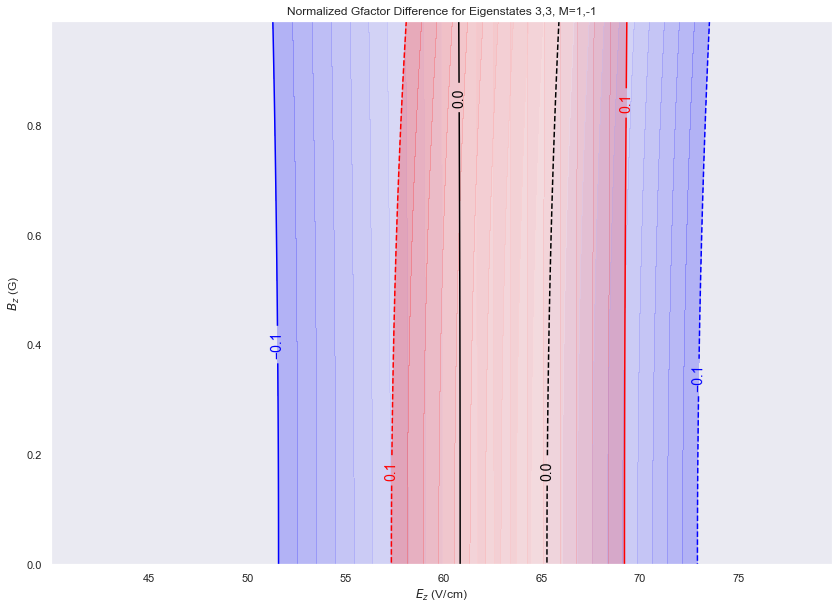

In [394]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,1)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# PTV_1 = PTV_dict[1][idx]
# PTV_2 = PTV_dict[-1][idx]
# delta_PTV = PTV_1 - PTV_2
# plt.contourf(*mesh[:,s1,s2],delta_PTV[s1,s2],levels=10,cmap='cool')
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5, fontsize=14,rightside_up=False)
        smallmap1 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5,fontsize=14,rightside_up=True)
        smallmap2 = plt.contourf(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS/2,cmap='bwr',linestyles='dashed',levels=np.linspace(-0.1,0.1,21),alpha=0.25,vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_17868/3213161298.py:42: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar()


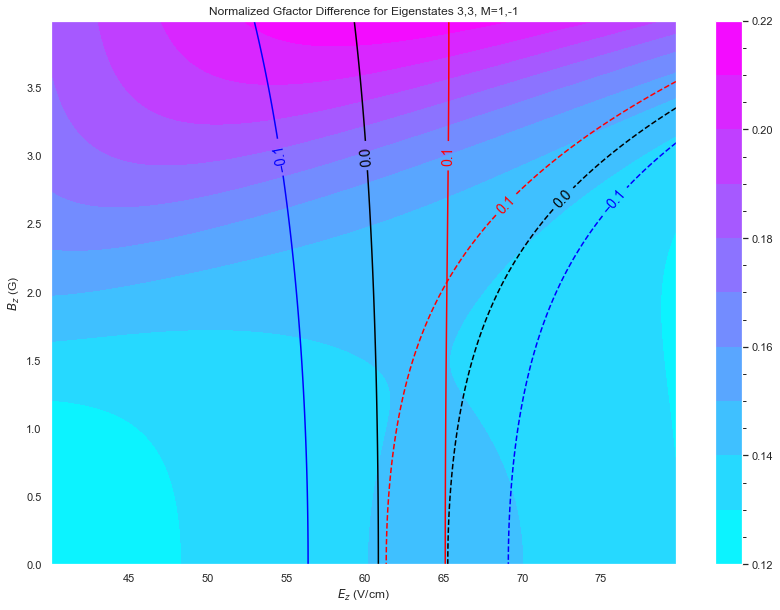

In [305]:
El = np.searchsorted(Ez,40)
Eu = np.searchsorted(Ez,80)
Bl = np.searchsorted(Bz,0)
Bu = np.searchsorted(Bz,4)
s1 = slice(El,Eu)
s2 = slice(Bl,Bu)


muBgS=1.399624494*2.0023/2
with_contour = True
idx = 3
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
plt.figure(figsize=(14,10))
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
if with_contour:
    try:
        conmap1 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS,colors=['blue','black','red'],levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap1, inline=True,inline_spacing=5,manual=[(55,3),(60,3),(65,3)], fontsize=14,rightside_up=False)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")
plt.title('Normalized Gfactor Difference for Eigenstates {},{}, M=1,-1'.format(idx,idx))
plt.xlabel(r'$E_z$ (V/cm)')
plt.ylabel(r'$B_z$ (G)')

idx = 4
evals_1 = eval_dict[1][idx]
evals_2 = eval_dict[-1][idx]
geff_1 = np.gradient(evals_1)[1]/(Bz[1]-Bz[0])
geff_2 = np.gradient(evals_2)[1]/(Bz[1]-Bz[0])
delta_geff = geff_1 - geff_2
plt.grid(False)
PTV_1 = PTV_dict[1][idx]
PTV_2 = PTV_dict[-1][idx]
delta_PTV = PTV_1 - PTV_2
plt.contourf(*mesh[:,s1,s2],delta_PTV[s1,s2],levels=10,cmap='cool')
cbar = plt.colorbar()
cbar.minorticks_on()
# plt.pcolormesh(*mesh,delta_geff/muBgS,shading='auto',cmap='seismic',vmin=-1,vmax=1)
# cbar = plt.colorbar()
# cbar.minorticks_on()
if with_contour:
    try:
        conmap2 = plt.contour(*mesh[:,s1,s2],delta_geff[s1,s2]/muBgS,colors=['blue','black','red'],linestyles='dashed',levels=[-0.1,0,0.1],vmin=-0.1,vmax=0.1)#norm=TwoSlopeNorm(vmin=-1,vcenter=0,vmax=1))
        plt.clabel(conmap2,inline=True,inline_spacing=5, manual=[(68,2.75),(72,2.75),(75,2.75)],fontsize=14,rightside_up=True)
#             cbar = plt.colorbar()
#             cbar.minorticks_on()
    except ValueError:
        print("Can't plot this data")